# **Homework for module 8 - Clustering**

# Introduction

Dataset contains information about earthquakes in 196x: coordinates, depth and strength. The task is to cluster the data

### Dataset description

Name "quake" from HOMEWORK_DATASETS from bds_courseware

### Attribute Information

Feature | Description | Format
--- | --- | ---
Focal depth | depth of earthquakes, km. | int64
Latitude | coordinate, grad.00 | float64
Longitude | coordinate, grad.00 | float64
Richter | magnitude.0 | float64

.

# **1. Import Data**

### 1.1. Import libraries



In [1]:
# !pip install fastapi
# !pip install kaleido
# !pip install python-multipart
# !pip install uvicorn
!pip install -U -q geopandas
!pip install -U -q Basemap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 860.7/860.7 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 23.0 MB/s eta 0:00:00


.

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import random
import itertools

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import calinski_harabasz_score, adjusted_rand_score
from sklearn.metrics import adjusted_mutual_info_score, silhouette_score, silhouette_samples
from sklearn.mixture import GaussianMixture
from sklearn.mixture._gaussian_mixture import _estimate_gaussian_parameters

!pip install descartes
from descartes import PolygonPatch

import geopandas as gpd
from scipy.cluster.hierarchy import dendrogram
from scipy import stats
from pyproj import Transformer
from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from mpl_toolkits.basemap import Basemap

.

### 1.2. Functions

In [3]:
# Function HEATMAP for missing data (NaN) in dataframes

def heatmap_missing_df(df):

    font_size = 12
    fig, axes = plt.subplots(1, 1, figsize=(17, 10))
    cmap = sns.diverging_palette(20, 275, s=80, as_cmap=True)

    sns.heatmap(df.isna(), cmap='plasma', cbar = False, yticklabels=False)

    plt.xticks(fontsize=font_size, rotation=45)
    axes.set_title("Missing values heatmap", fontsize=font_size+4)
    axes.tick_params(axis='y', length=0)

In [4]:
def plot_silhouette(model, X, X_2d, max_num_clusters=5):
    for n_clusters in range(2, max_num_clusters):
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)
        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        clusterer = model(n_clusters=n_clusters, random_state=0)
        cluster_labels = clusterer.fit_predict(X)
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters, \
              "The average silhouette_score is :", silhouette_avg)

        sample_silhouette_values = silhouette_samples(X_scaled, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X_2d[:, 0], X_2d[:, 1], marker='.', s=300, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                    "with n_clusters = %d" % n_clusters),
                    fontsize=14, fontweight='bold')

    plt.show()

In [5]:
# Plot scatters on 4 planes and 4 earth map with clustering

def scatters_4x2_graphs(df_0123):

    m = plt.figure(figsize=(22,10))
    fig = plt.figure(figsize=(22,10))
    fig.subplots_adjust(hspace=0.4, top=0.9)
    fig.suptitle("Earthquakes clustering in 4 depth-classes (plane and map)", fontsize=15)

    title_depth = ['surface (0 km)',
                   'shallow-focus (1-70 km)',
                   'intermediate-depth (70-300 km)',
                   'deep-focus (> 300 km)']

    # Earthquake locations on a plane

    for i, dfi in enumerate(df_0123):
        plt.subplot(2, 4, i+1)
        plt.ylim(-80, 80)
        fig = sns.scatterplot(y=dfi['Latitude'],
                              x=dfi['Longitude'],
                              hue=dfi['Clusters'],
                              palette='rainbow',
                              legend='full').set(title=title_depth[i])
        plt.legend(loc='lower left')

    # The same earthquake locations, but on the map

    for i, dfi in enumerate(df_0123):
        plt.subplot(2, 4, i+5)
        m = Basemap()
        m.drawcoastlines()
        m.scatter(y=dfi['Latitude'],
                  x=dfi['Longitude'],
    #              c='blue',
                  c=dfi['Clusters'].astype('float'),
                  cmap='rainbow')

    plt.show()

.

### 1.3. Import data

#### 1.3.1. Read from bds_courseware

In [6]:
!pip install bds_courseware
from bds_courseware import read_drive_dataset
from bds_courseware import print_dataset_description, print_module_datasets
from bds_courseware import HOMEWORK_DATASETS

In [7]:
print("\nDataset names: ", HOMEWORK_DATASETS.keys())
name = "quake"
df = read_drive_dataset(*HOMEWORK_DATASETS[name]).copy()
print(' ')
print(df.shape)


Dataset names:  dict_keys(['suicide_rates', 'car_perfs', 'brain', 'bank', 'air_quality', 'hypothyroid', 'movies', 'bike_sharing_day', 'bike_sharing_hour', 'quake'])
 
(2178, 4)


In [8]:
df

,Focal depth,Latitude,Longitude,Richter
0,33,-52.26,28.30,6.7
1,36,45.53,150.93,5.8
2,57,41.85,142.78,5.8
3,67,29.19,141.15,6.2
4,30,-21.66,169.81,6.0
...,...,...,...,...
2173,13,51.54,-173.11,5.8
2174,97,-10.16,161.01,5.9
2175,527,27.87,139.51,5.8
2176,51,36.43,140.98,6.0


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178 entries, 0 to 2177
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Focal depth  2178 non-null   int64  
 1   Latitude     2178 non-null   float64
 2   Longitude    2178 non-null   float64
 3   Richter      2178 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 68.2 KB


.

# **2. Data Preprocessing**

### 2.1. Duplicates

In [10]:
df.duplicated().sum()

1

Delete this row

In [11]:
df = df.drop_duplicates()

In [12]:
# reindexing after deleting duplicate row

df.reset_index(drop=True, inplace=True)

.

### 2.2. Missing data (NaN)

In [13]:
df.isna().sum().sort_values(ascending=False)

Focal depth    0
Latitude       0
Longitude      0
Richter        0
dtype: int64

Crystal clear data! :)

.

# **3. EDA**

### 3.1. Describe and look into 'Focal depth'

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Focal depth,2177.0,74.394120,116.483644,0.00,21.00,39.00,68.00,656.00
Latitude,2177.0,7.942747,30.539383,-66.49,-12.44,0.20,36.48,78.15
Longitude,2177.0,54.903785,118.901774,-179.96,-67.79,122.11,146.87,180.00
Richter,2177.0,5.977216,0.189463,5.80,5.80,5.90,6.10,6.90


In [15]:
df['Focal depth'].value_counts()

0      144
33     121
10      61
45      40
43      36
      ... 
328      1
574      1
333      1
170      1
527      1
Name: Focal depth, Length: 312, dtype: int64

Too much zero-depth - it's some strange for earthquakes. Let's take a closer look at this aspect, but a little later.

.

### 3.2. Depth in histagram

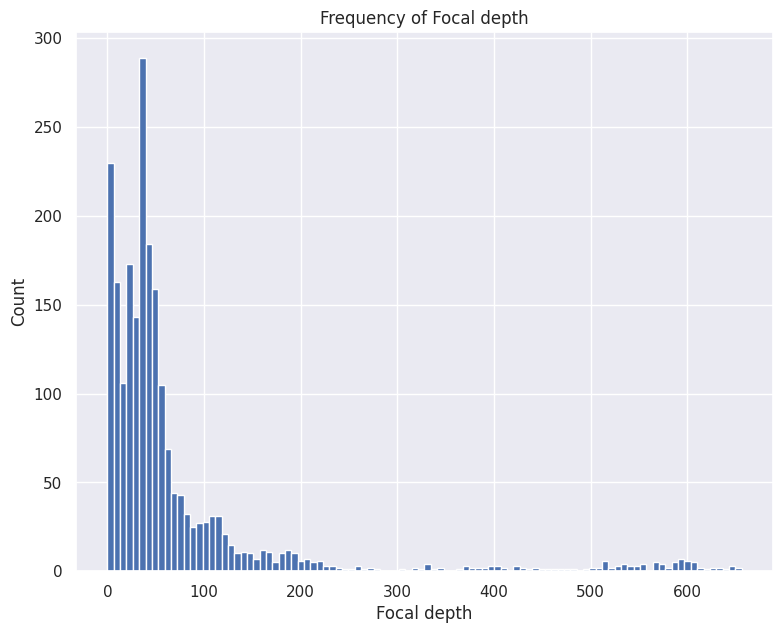

In [16]:
# Distribution of target
sns.set(style="darkgrid")
plt.rcParams['figure.figsize']=(9,7)
plt.hist(df['Focal depth'], bins=100)
plt.xlabel('Focal depth')
plt.ylabel('Count')
plt.title('Frequency of Focal depth')
plt.show()

There are may be some anomalies - it's necessary to apply log-scale, see below.

.

### 3.3. Zero-depth earthquakes

In [17]:
def to_int_size(value):
        return np.exp(value)**(1/3)

plt.rcParams['figure.figsize']=(18,10)
fig = go.Figure(go.Scattermapbox(lat=df[df['Focal depth'] == 0]['Latitude'],
                                 lon=df[df['Focal depth'] == 0]['Longitude'],
                                 marker=dict(colorbar=dict(title="Richter"),
                                             color=df['Richter'],
                                             size=df['Richter'].map(to_int_size))))
fig.update_layout(mapbox_style="open-street-map")
fig.show()
# open-street-map
# stamen-terrain
# carto-darkmatter
# carto-positron
# stamen-toner
# stamen-watercolor

Consider these points with a map of Nuclear Explosions.

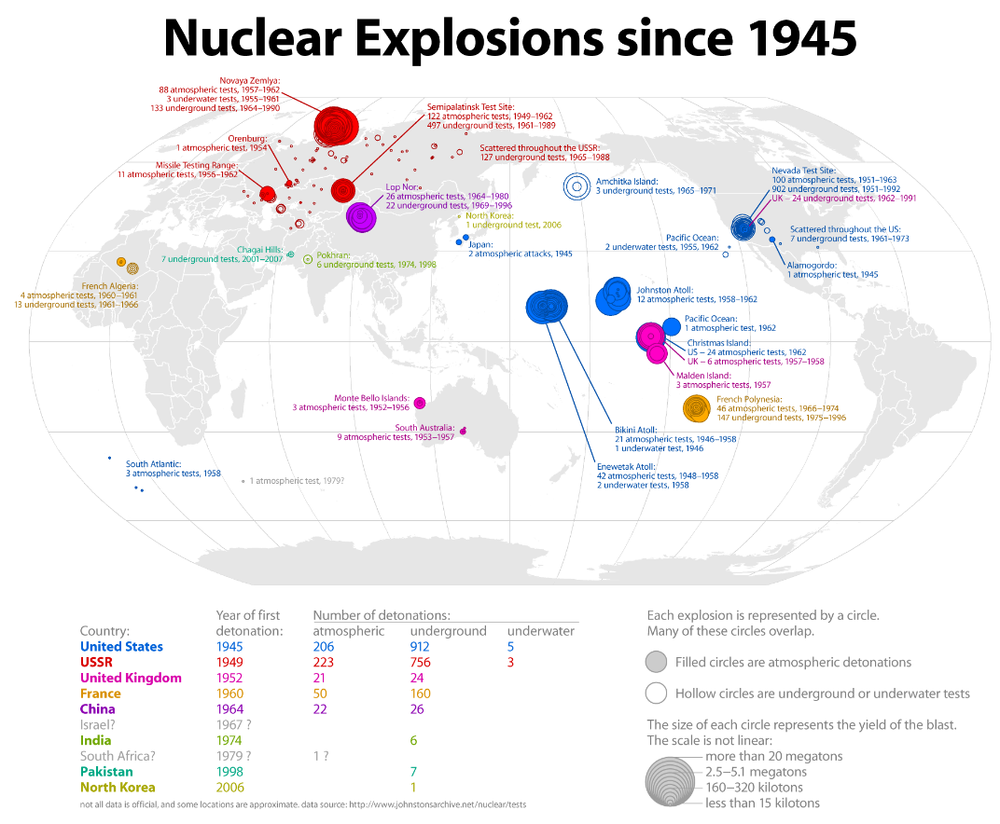

Source of the map: https://www.reddit.com/r/MapPorn/comments/8bjo1r/every_nuclear_explosion_since_19451944x1611/

Some nuclear testing grounds are coincide on maps:
- atoll Moruroa
- Sary Shagan
- Novaya Zemlya
- Algeria
- etc.

But not all of them are nuclear explosion, for example:
- New Zealand - explosion of largest underground coal mine.
- Norwegian volcanic island - volcano Beerenberg.



In [18]:
#df = df.loc[df['Focal depth'] != 0]

.

### 3.4. Depth with LOG-scale in histogram

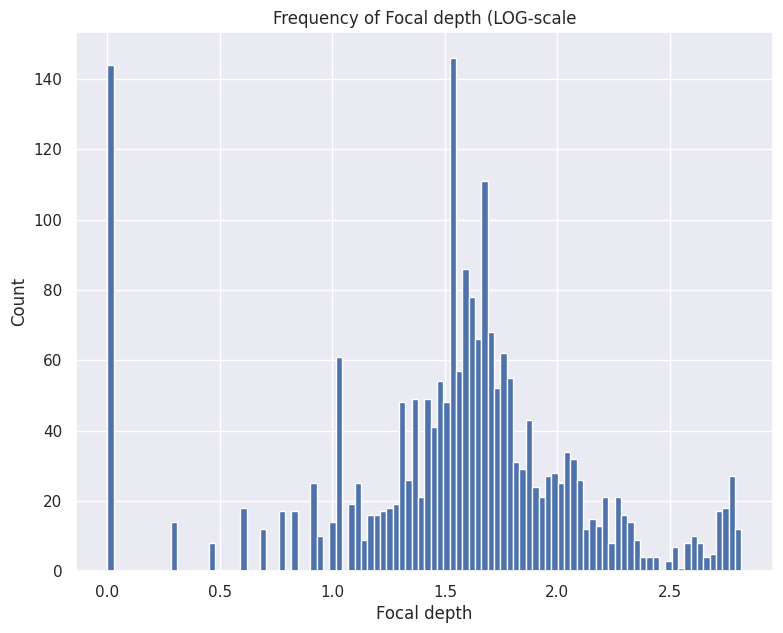

In [19]:
# Distribution of target
sns.set(style="darkgrid")
plt.rcParams['figure.figsize']=(9,7)
plt.hist(np.log10(df['Focal depth'].values + 1), bins=100)
plt.xlabel('Focal depth')
plt.ylabel('Count')
plt.title('Frequency of Focal depth (LOG-scale')
plt.show()

There are some peaks - let's apply visual distribusions below.

.

#### 3.4.1. Apply Gaussian mixture model for depth classifing

In [20]:
# printing names and count using loop.
df_123 = pd.DataFrame()
depth = []
quant =[]
for idx, name in enumerate(df['Focal depth'].value_counts().index.tolist()):
    #print(name, ':', df['Focal depth'].value_counts(ascending=True)[idx])
    try:
        quant.append(df['Focal depth'].value_counts()[idx])
        depth.append(np.log10(name + 1))
    except KeyError:
         continue
df_123['depth'] = depth
df_123['quant'] = quant

In [21]:
'''# Based on https://scikit-learn.org/stable/auto_examples/mixture/plot_gmm_init.html#sphx-glr-download-auto-examples-mixture-plot-gmm-init-py

# X = df_with_cat.loc[:, ['Longitude', 'Latitude', 'Richter', 'depth_cat_nr']]
#X = np.log10(df['Focal depth'].values + 1)
X = df_123
range_n_clusters = [2, 3, 4, 5]

# def get_initial_means(X, init_params, r, n_comp):
#     # Run a GaussianMixture with max_iter=0 to output the initalization means
#     gmm = GaussianMixture(n_components=n_comp,
#                           init_params=init_params,
#                           tol=1e-9,
#                           max_iter=1,
#                           random_state=r).fit(X)
#     return gmm.means_, gmm.covariances_, gmm.weights_
'''

"# Based on https://scikit-learn.org/stable/auto_examples/mixture/plot_gmm_init.html#sphx-glr-download-auto-examples-mixture-plot-gmm-init-py\n\n# X = df_with_cat.loc[:, ['Longitude', 'Latitude', 'Richter', 'depth_cat_nr']]\n#X = np.log10(df['Focal depth'].values + 1)\nX = df_123\nrange_n_clusters = [2, 3, 4, 5]\n\n# def get_initial_means(X, init_params, r, n_comp):\n#     # Run a GaussianMixture with max_iter=0 to output the initalization means\n#     gmm = GaussianMixture(n_components=n_comp,\n#                           init_params=init_params,\n#                           tol=1e-9,\n#                           max_iter=1,\n#                           random_state=r).fit(X)\n#     return gmm.means_, gmm.covariances_, gmm.weights_\n"

In [22]:
'''X = df['Focal depth']
X = X[X > 0]
X = np.log10(X.values + 1)


silhouette_list = []
for n_clusters in range_n_clusters:

    r = np.random.RandomState(seed=22)
    clusterer = GaussianMixture(n_components=n_clusters,
                                covariance_type='diag',
                                n_init=50,
                                max_iter=2000,
                                means_init=ini,
                                random_state=22) #, init_params='k-means++')
    cluster_labels = clusterer.fit_predict(X)
    ini, ini_cov, ini_weights = clusterer.means_, clusterer.covariances_, clusterer.weights_
    cluster_labels.shape
#    label = clusterer.labels_
#    centroids = clusterer.clusterer.means_

    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_list.append(silhouette_avg)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", round(silhouette_avg, 3))

plt.subplots(1, 1, figsize=(15, 10))
plt.plot(range_n_clusters, silhouette_list, '-bo')
plt.grid()
plt.show()'''

'X = df[\'Focal depth\']\nX = X[X > 0]\nX = np.log10(X.values + 1)\n\n\nsilhouette_list = []\nfor n_clusters in range_n_clusters:\n\n    r = np.random.RandomState(seed=22)\n    clusterer = GaussianMixture(n_components=n_clusters,\n                                covariance_type=\'diag\',\n                                n_init=50,\n                                max_iter=2000,\n                                means_init=ini,\n                                random_state=22) #, init_params=\'k-means++\')\n    cluster_labels = clusterer.fit_predict(X)\n    ini, ini_cov, ini_weights = clusterer.means_, clusterer.covariances_, clusterer.weights_\n    cluster_labels.shape\n#    label = clusterer.labels_\n#    centroids = clusterer.clusterer.means_\n\n    silhouette_avg = silhouette_score(X, cluster_labels)\n    silhouette_list.append(silhouette_avg)\n    print("For n_clusters =", n_clusters,\n          "The average silhouette_score is :", round(silhouette_avg, 3))\n\nplt.subplots(1, 1, fig

In [23]:
'''for n_clusters in range_n_clusters:

    r = np.random.RandomState(seed=22)
    ini, ini_cov, ini_weights = get_initial_means(X, 'kmeans', r, n_clusters)
    clusterer = GaussianMixture(n_components=n_clusters,
                                covariance_type='diag',
                                n_init=50,
                                max_iter=2000,
                                means_init=ini,
                                random_state=22) #, init_params='k-means++')
    cluster_labels=clusterer.fit_predict(X)
    cluster_labels.shape
#    label = clusterer.labels_
#    centroids = clusterer.clusterer.means_

    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", round(silhouette_avg, 3))'''

'for n_clusters in range_n_clusters:\n\n    r = np.random.RandomState(seed=22)\n    ini, ini_cov, ini_weights = get_initial_means(X, \'kmeans\', r, n_clusters)\n    clusterer = GaussianMixture(n_components=n_clusters,\n                                covariance_type=\'diag\',\n                                n_init=50,\n                                max_iter=2000,\n                                means_init=ini,\n                                random_state=22) #, init_params=\'k-means++\')\n    cluster_labels=clusterer.fit_predict(X)\n    cluster_labels.shape\n#    label = clusterer.labels_\n#    centroids = clusterer.clusterer.means_\n\n    silhouette_avg = silhouette_score(X, cluster_labels)\n    print("For n_clusters =", n_clusters,\n          "The average silhouette_score is :", round(silhouette_avg, 3))'

Value 0.696 says about 3 clusters.

.

#### 3.4.2. Manual Gauss distribution for depth

In [24]:
#ini = [0, 1.6, 2, 2.7]

def get_initial_means(X, init_params, r):
    # Run a GaussianMixture with max_iter=0 to output the initalization means
    gmm = GaussianMixture(
        n_components=3, init_params=init_params, tol=1e-9, max_iter=100, random_state=r
    ).fit(X)
    return gmm.means_

#X = np.log10(df['Focal depth']).values)
X = df_123
r = np.random.RandomState(seed=22)
ini = get_initial_means(X, 'kmeans', r)

clusterer = GaussianMixture(n_components=3,
                                covariance_type='diag',
                                n_init=50,
                                max_iter=2000,
                                means_init=ini,
                                random_state=22) #, init_params='k-means++')
cluster_labels=clusterer.fit_predict(X)
cluster_labels.shape

(212,)

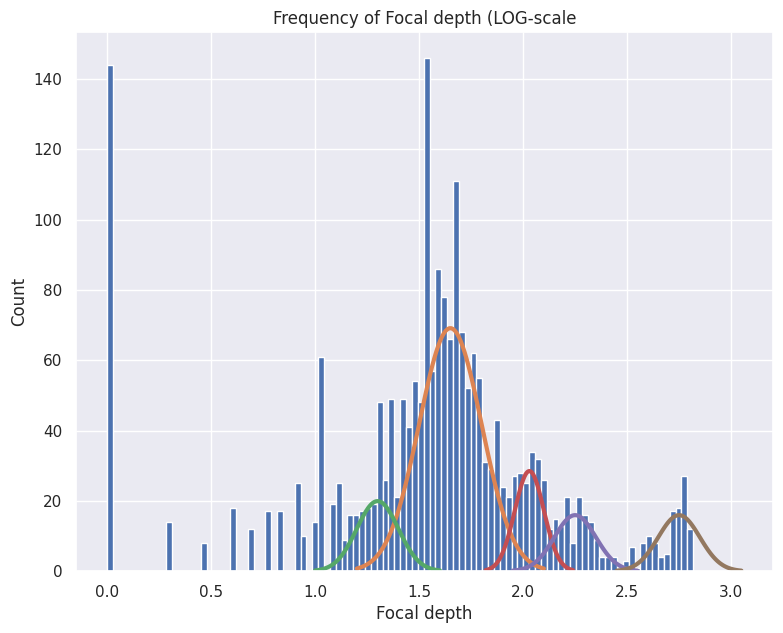

In [25]:
# Distribution of target
sns.set(style="darkgrid")
plt.rcParams['figure.figsize']=(9,7)
plt.hist(np.log10(df['Focal depth'].values + 1), bins=100)
plt.xlabel('Focal depth')
plt.ylabel('Count')
plt.title('Frequency of Focal depth (LOG-scale')

# Manual values
mu = [1.65, 1.3, 2.03, 2.25, 2.75]
sigma = [0.15, 0.1, 0.07, 0.1, 0.1]
A = [26, 5, 5, 4, 4]
proba_fitted = []
#sigma = clusterer.covariances_

#for k, A in enumerate(clusterer.weights_):
for k, A in enumerate(A):
    proba_fitted.append(A * random.gauss(mu[k], sigma[k]))

    xx = np.linspace(mu[k] - 3*sigma[k], mu[k] + 3*sigma[k], 100)
    plt.plot(xx, A * stats.norm.pdf(xx, mu[k], sigma[k]), linewidth = 3)

plt.show()


There are some mixed Gauss distributions on the depth-histogram. It's duffucult to devide by the histogram, bit let's try:
- two subpeaks with 2.03 and 2.25 that correspond to 107 km and 178 km.
- the last peak with 2.75 - 562 km.
- 3 main earthquake categories are suitable: 0-70-300-6400 km. 70 km right on 1.85 between the highest distribution and others on right side.

.

### 3.5. Earthquake depth-categories - 4 types

#### 3.5.0. Introduction

Let's add 4 earthquake categories by depth for feature 'Focal depth' ([wikipedia](https://en.wikipedia.org/wiki/Earthquake)):
- **surface**: 0 km
- **shallow-focus**: 1-70 km
- **intermediate-depth**: 70-300 km
- **deep-focus**: more than 300 km

These are associated with the layers of the structure of the planet Earth.

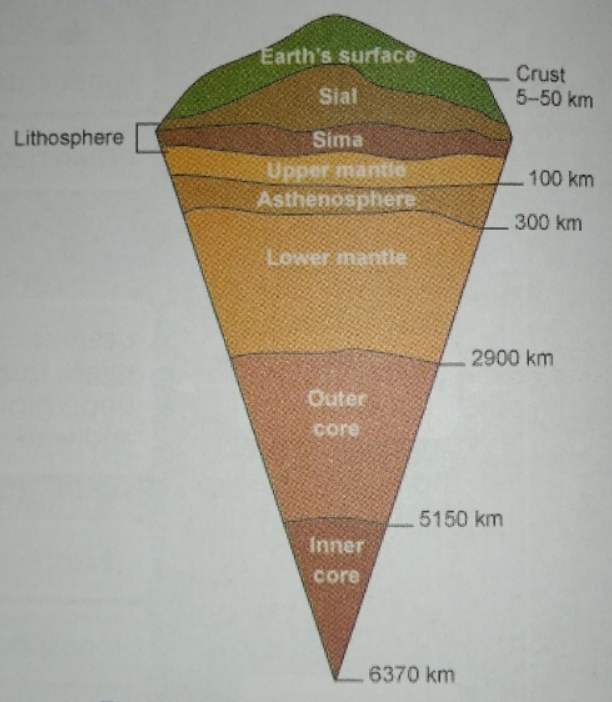

.

#### 3.5.1. Convert longitude into -50 grads

The longitude range is -180...+180. When searching for distances between points on the border of this range, the places of earthquake accumulation are separated. At longitude -50, the accumulation of earthquake points is minimal. Therefore, for all values which is less than -50 grad I add the value 360.

In [26]:
# df['Longitude_50'] = 0
# df['Longitude_50'] = df['Longitude'].apply(lambda x: x + 360 if x < -50 else x)

df = df.assign(Longitude_50 = df['Longitude'].apply(lambda x: x + 360 if x < -50 else x))

In [27]:
# Alternative approach 2

# df['Longitude_50'] = 0.00
# for i in range(len(df['Longitude'])):
#     if df['Longitude'][i] < -50:
#         df['Longitude_50'][i] = df['Longitude'][i] + 360
#     else:
#         df['Longitude_50'][i] = df['Longitude'][i]

In [28]:
# Alternative approach 3

def longitude_dist(long1, long2):
    dist = long2 - long1
    if asb(dist) > 180:
        return 360 - dist
    else:
        return dist

.

#### 3.5.2. Convert GPS coordinates into 3-dimensional cartesian coordinates (x,y,z)

But the transition to 3D coordinates on the ball is more correct, because the end of the range is avoided, and the distances are looked up as the smallest distance, not the surface distance.

In [29]:
# https://gis.stackexchange.com/questions/409379/convert-gps-coordinates-into-3-dimensional-cartesian-coordinates-x-y-z

df['xx'] = 0.0
df['yy'] = 0.0
df['zz'] = 0.0
trans_GPS_to_XYZ = Transformer.from_crs(4979, 4978, always_xy=True)

for i in range(len(df['Longitude'])):
    xx, yy, zz = trans_GPS_to_XYZ.transform(df['Longitude'][i],
                                            df['Latitude'][i],
                                            df['Focal depth'][i]*1000)
    df.loc[i,'xx'] = round(xx/1000, 1)
    df.loc[i,'yy'] = round(yy/1000, 1)
    df.loc[i,'zz'] = round(zz/1000, 1)

    # df['xx'][i] = round(xx/1000, 1)
    # df['yy'][i] = round(yy/1000, 1)
    # df['zz'][i] = round(zz/1000, 1)

df

,Focal depth,Latitude,Longitude,Richter,Longitude_50,xx,yy,zz
0,33,-52.26,28.30,6.7,28.30,3462.3,1864.3,-5046.7
1,36,45.53,150.93,5.8,150.93,-3934.0,2186.9,4554.5
2,57,41.85,142.78,5.8,142.78,-3822.8,2903.8,4271.2
3,67,29.19,141.15,6.2,141.15,-4385.4,3532.3,3125.0
4,30,-21.66,169.81,6.0,169.81,-5864.4,1054.1,-2350.5
...,...,...,...,...,...,...,...,...
2172,13,51.54,-173.11,5.8,186.89,-3954.5,-477.8,4981.3
2173,97,-10.16,161.01,5.9,161.01,-6027.3,2074.2,-1134.8
2174,527,27.87,139.51,5.8,139.51,-4645.5,3966.2,3210.1
2175,51,36.43,140.98,6.0,140.98,-4023.6,3260.6,3797.0


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2177 entries, 0 to 2176
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Focal depth   2177 non-null   int64  
 1   Latitude      2177 non-null   float64
 2   Longitude     2177 non-null   float64
 3   Richter       2177 non-null   float64
 4   Longitude_50  2177 non-null   float64
 5   xx            2177 non-null   float64
 6   yy            2177 non-null   float64
 7   zz            2177 non-null   float64
dtypes: float64(7), int64(1)
memory usage: 136.2 KB


.

#### 3.5.3. Four depth classes

Now it's time ti devide depth into 4 classes:
- 0 km for еechnogenic explosions and tremors
- 3 sciencific gradations of depth from 3.5.0

In [31]:
df_with_cat = df.copy()

bins = [-1,0,70,300,1000]              #devide
depth_names = ['surface', 'shallow-focus','intermediate-depth','deep-focus']
depth_names_nr = [0, 1, 2, 3]
depth_cat = pd.cut(df_with_cat['Focal depth'], bins, labels=depth_names)
depth_cat_nr = pd.cut(df_with_cat['Focal depth'], bins, labels=depth_names_nr)

df_with_cat['depth_cat'] = pd.cut(df_with_cat['Focal depth'], bins, labels=depth_names)
df_with_cat['depth_cat_nr'] = pd.cut(df_with_cat['Focal depth'], bins, labels=depth_names_nr)
df_with_cat['depth_cat_nr'] = df_with_cat['depth_cat_nr'].astype('int64')

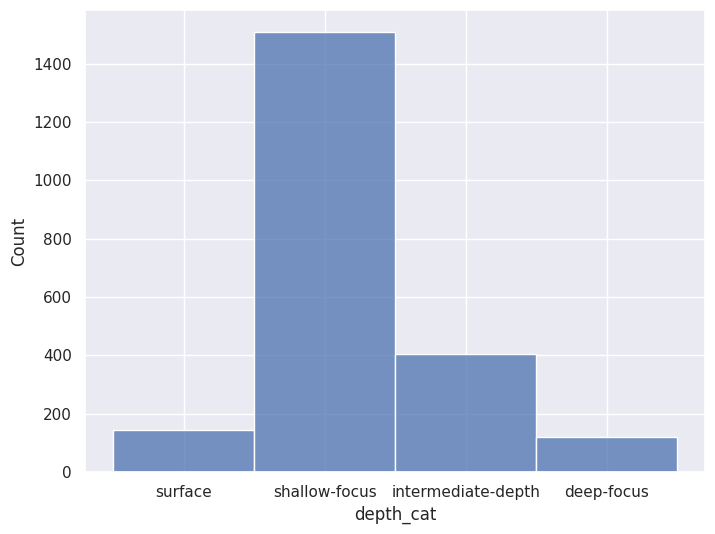

In [32]:
plt.figure(figsize=(8,6))
sns.histplot(df_with_cat['depth_cat'])
plt.show()

Surface exlopsions and deep-focus earthquakes are similar in its quantity.

In [33]:
title_depth = ['surface (0 km)', 'shallow-focus (1-70 km)', 'intermediate-depth (70-300 km)', 'deep-focus (> 300 km)']

<Figure size 2200x1000 with 0 Axes>

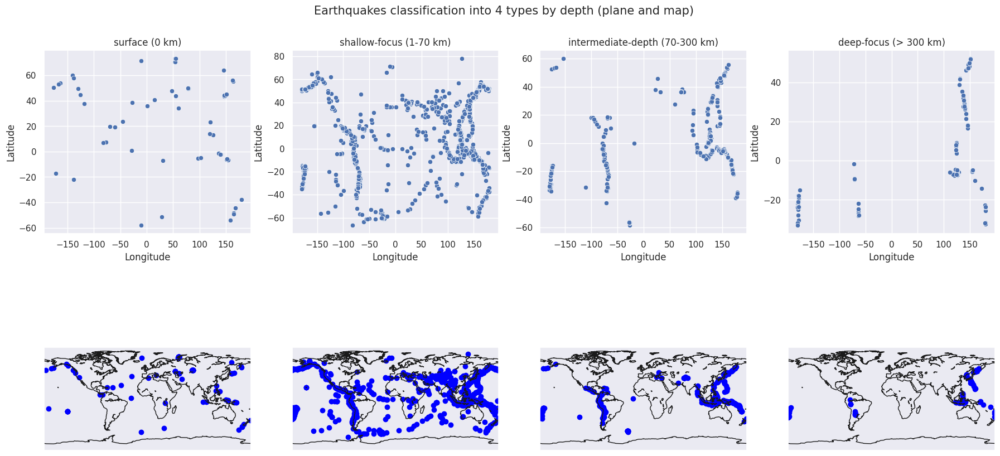

In [34]:
m = plt.figure(figsize=(22,10))
fig = plt.figure(figsize=(22,10))
fig.subplots_adjust(hspace=0.4, top=0.9)
fig.suptitle("Earthquakes classification into 4 types by depth (plane and map)",
             fontsize=15)

# Earthquake locations on a plane

for i, depth in enumerate(depth_names):
    plt.subplot(2, 4, i+1)
    sns.scatterplot(y=df_with_cat[df_with_cat['depth_cat'] == depth]['Latitude'],
                    x=df_with_cat[df_with_cat['depth_cat'] == depth]['Longitude'],
                    legend='full').set(title=title_depth[i])

# The same earthquake locations, but on the map

for i, depth in enumerate(depth_names):
    plt.subplot(2, 4, i+5)
    m = Basemap()
    m.drawcoastlines()
    m.scatter(y=df_with_cat[df_with_cat['depth_cat'] == depth]['Latitude'],
              x=df_with_cat[df_with_cat['depth_cat'] == depth]['Longitude'],
              c='blue')

plt.show()

Surface category I could delete, but it's a mix with technogenic explosions and volcanic activity. And it was a quake infuence on the planet. Nowadays there are almost no nuclear explosions, but there may be other weaker ones.

The deepest earthquakes are in LA, south-east Asia and area around Australia (north and east) - apparently, there are the deepest cracks of the converging plates.

.

### 3.6. Earthquakes depending on Magnitude - map and histogram

In [35]:
def to_int_size(value):
        return np.exp(value)**(1/3)

fig = go.Figure(go.Scattermapbox(lat=df['Latitude'],
                                 lon=df['Longitude'],
                                 marker=dict(colorbar=dict(title="Richter"),
                                             color=df['Richter'],
                                             size=df['Richter'].map(to_int_size))))
fig.update_layout(mapbox_style="carto-positron")
fig.show()
# open-street-map
# stamen-terrain
# carto-darkmatter
# carto-positron
# stamen-toner
# stamen-watercolor

In [36]:
fig = px.histogram(df,
                   x = "Richter",
                   text_auto = True,
                   width = 700,
                   height = 500,
                   title = 'Frequency of Richter')
fig.update_layout(bargap = 0.2)
fig.show()

In [37]:
df['Richter'].nunique()

12

Exponential decrease in the number of earthquakes with increasing magnitude.

The Richter scale contains arbitrary units (generally from 1 to 9.5) - magnitudes.

The range of registered magnitudes in the dataset: from 5.8 to 6.9.

.

### 3.7. Feature correlations

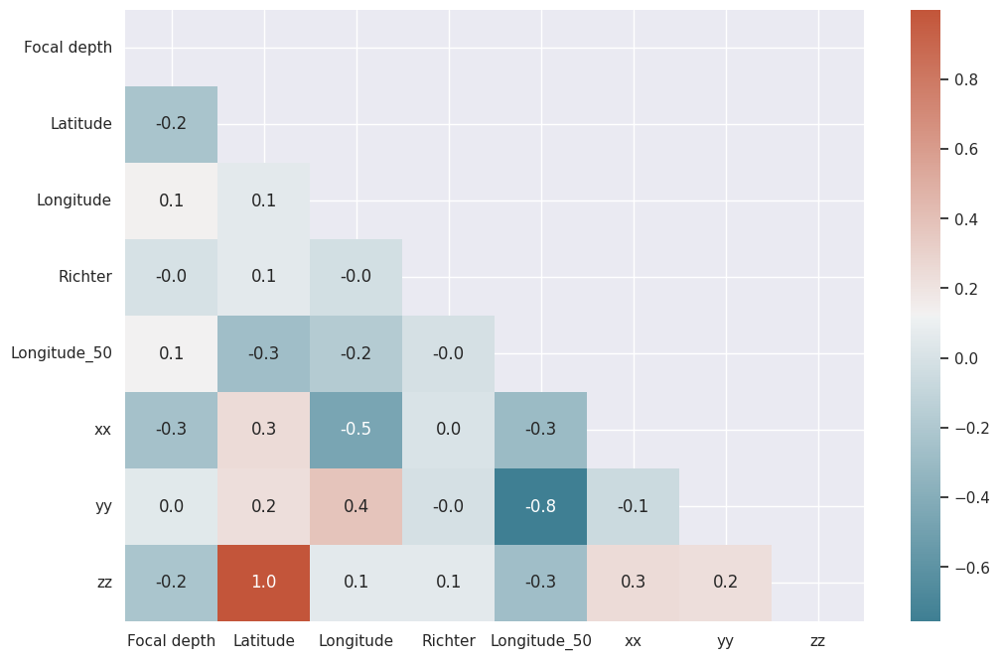

In [38]:
sns.set_theme()

plt.figure(figsize=(12,8))
matrix = np.triu(df.corr(method='spearman'))
sns.heatmap(df.corr(method='spearman'),
            cmap=sns.diverging_palette(220, 20, as_cmap=True),
            annot=True,
            mask=matrix,
            fmt='.1f')
plt.show()

There is no high correlation between original features.

.

# **4. K-Means clustering algorithm**

### 4.1. K-Means on map (15 clusters)

#### 4.1.1. K-Means with all features

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



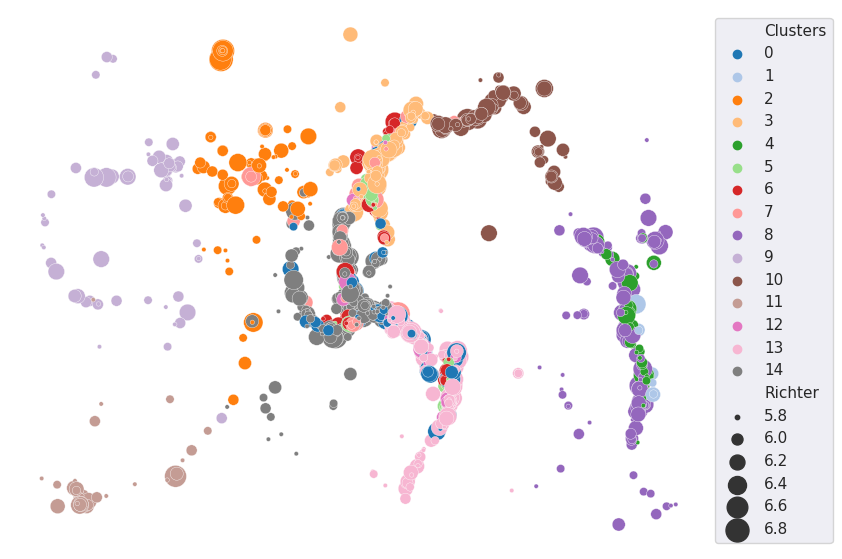

In [39]:
feat_list = ['Longitude_50', 'Latitude', 'Focal depth', 'Richter']

kmeans = KMeans(n_clusters=15, random_state=22).fit(df.loc[:, feat_list])
# (df.loc[:, ['Longitude', 'Latitude', 'Focal depth']])

df['Clusters'] = kmeans.labels_

sns.scatterplot(x=df['Longitude_50'],
                y=df['Latitude'],
                hue=df['Clusters'],
                palette='tab20',
                size=df['Richter'],
                sizes=(10,300),
                legend='brief')
plt.legend(loc=2,
           bbox_to_anchor=(1.0, 1.0))
plt.axis('off')
plt.show()

Such clustering gives us not good picture due to significant influence of 'Focal depth'.

.

#### 4.1.2. K-Means without feature 'Focal depth'

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



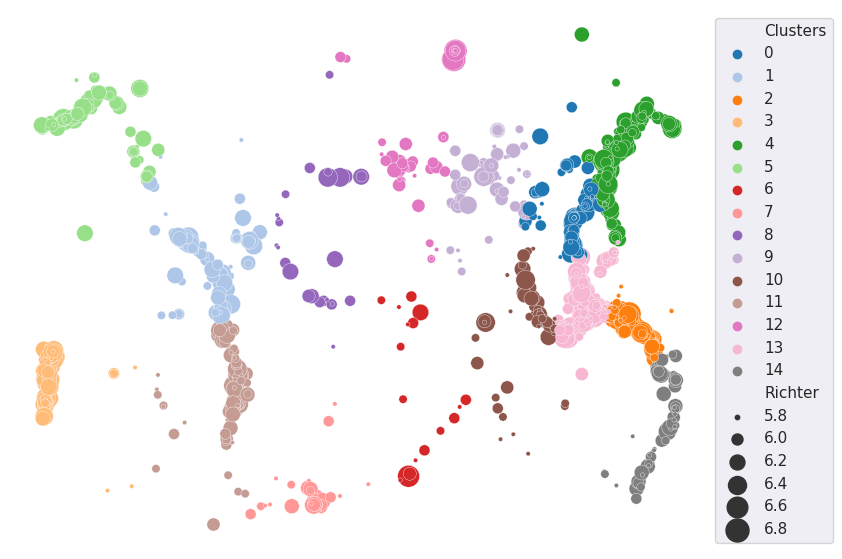

In [40]:
kmeans = KMeans(n_clusters=15, random_state=22).fit(df.loc[:, ['Longitude', 'Latitude', 'Richter']])
df['Clusters'] = kmeans.labels_

sns.scatterplot(x=df['Longitude'],
                y=df['Latitude'],
                hue=df['Clusters'],
                palette='tab20',
                size=df['Richter'],
                sizes=(10,300),
                legend='brief')
plt.legend(loc=2,
           bbox_to_anchor=(1.0, 1.0))
plt.axis('off')
plt.show()

Without feature 'Focal depth' it is possible to see quite good clustering.

The same clustering combined with continents with dependence from depth using a map from library "Plotly":

In [41]:
def to_int_size(value):
        return value**(1/2)

fig = go.Figure(go.Scattermapbox(lat=df.Latitude,
                                 lon=df.Longitude,
                                 marker=dict(colorbar=dict(title="Clusters"),
                                             showscale=True,
                                             colorscale='turbo',
                                             color=df.Clusters,
                                             size=df['Focal depth'].map(to_int_size))))

# colorscale options
# 'Greys' | 'Greens' | 'Bluered' | 'Hot' | 'Picnic' | 'Portland' |
# Jet' | 'RdBu' | 'Blackbody' | 'Earth' | 'Electric' | 'YIOrRd' | 'YIGnBu'

fig.update_layout(title="K-Means clustering without feature 'Focal depth' (the bigger the circle, the deeper the depth)", mapbox_style="carto-positron")
fig.show()

# Types of earth views
# open-street-map
# stamen-terrain
# carto-darkmatter
# carto-positron
# stamen-toner
# stamen-watercolor

According to the scheme below the main earthquakes in zones, where tectonic plates converge.

Eye analysis (min 8 clusters for my own opinion):
- 2 clusters in Americas
- 2 clusters around Australia
- 1 cluster near China
- 1 cluster between Asia and north America
- 1 cluster in Africa
- 1 cluster in Eurasia

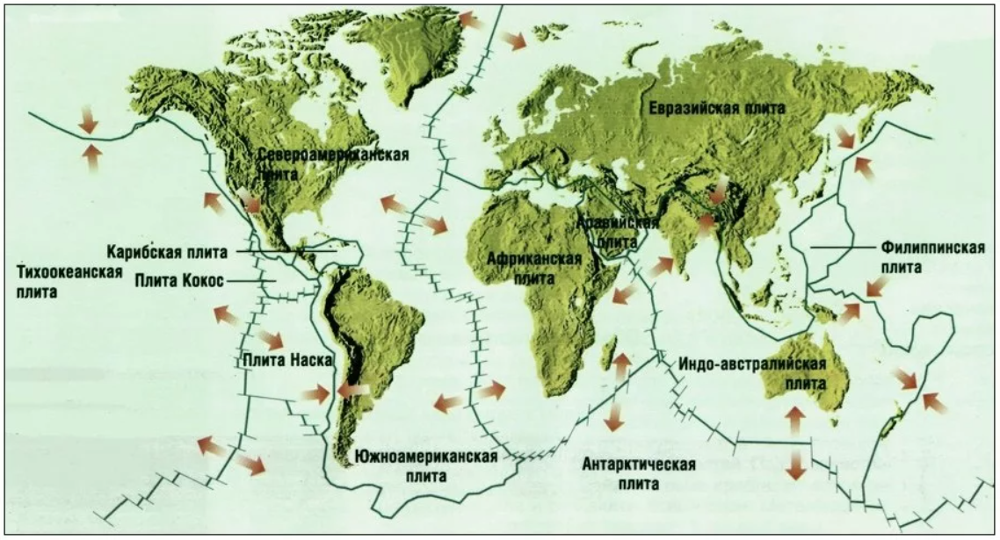

.

### 4.2. Determine optimal number of clusters for K-Means

#### 4.2.1. Optimization with the Elbow rule

Elbow rule is rule for selecting optimal points of monotonic curves.

Inertia: this is the sum of the squared distances from the samples to the nearest cluster center.

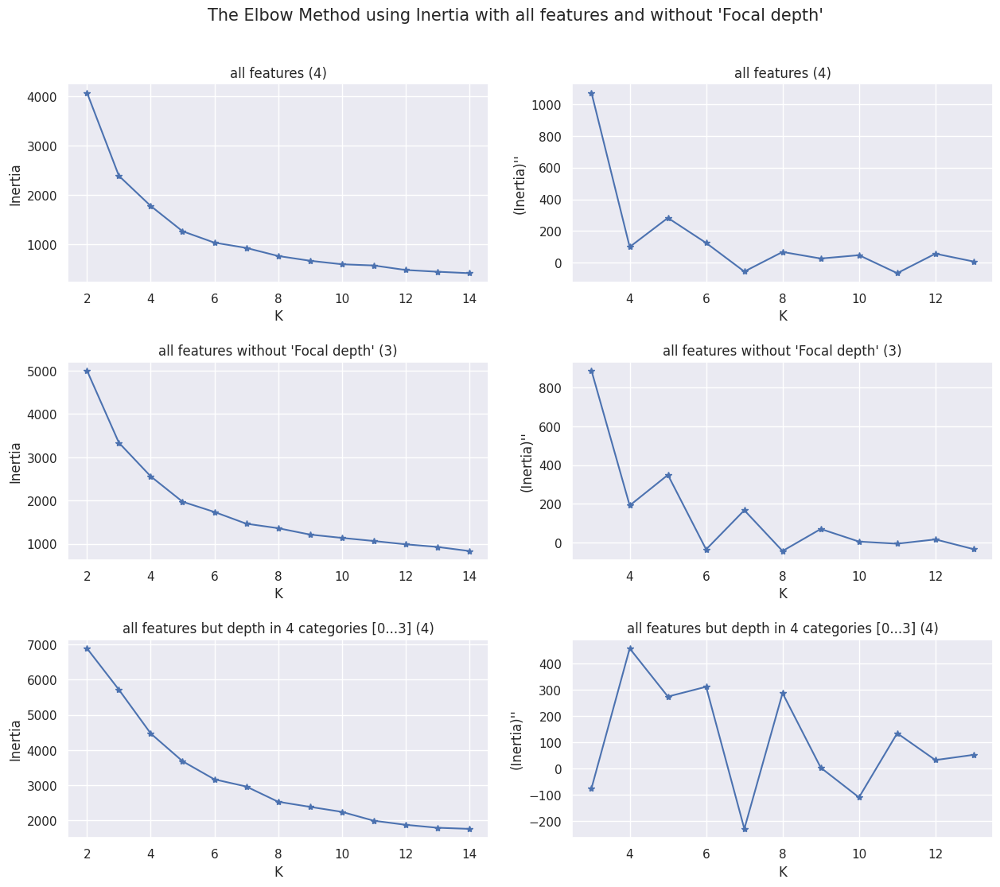

In [87]:
#Finding the optimal K using the elbow method

fig = plt.figure(figsize=(15,12))
fig.subplots_adjust(hspace=0.4, top=0.9)
fig.suptitle("The Elbow Method using Inertia with all features and without 'Focal depth'", fontsize=15)

df_box = [df.loc[:, ['xx', 'yy', 'zz']],
          df.loc[:, ['Longitude', 'Latitude', 'Richter']],
          df_with_cat.loc[:,['Longitude', 'Latitude', 'Richter', 'depth_cat_nr']]
          ]
feat_title = ['all features (4)',
              "all features without 'Focal depth' (3)",
              'all features but depth in 4 categories [0...3] (4)']

for i, dfs in enumerate(df_box):
#    fig = plt.figure(figsize=(15,8))

    plt.subplot(3, 2, 2*i+1)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(dfs)
    inertias = []
    cluster_range = range(2,15)
    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters,
                        n_init='auto',
                        random_state=22)
        cluster_labels = kmeans.fit_predict(X_scaled)
        inertias.append(kmeans.inertia_)
    plt.title(feat_title[i])
    plt.xlabel('K')
    plt.ylabel('Inertia')
    plt.plot(cluster_range, inertias, marker="*")

    plt.subplot(3, 2, 2*i+2)

    y = np.zeros(len(inertias) - 2)
    for j in range(len(inertias) - 2):
        y[j] = inertias[j] +  inertias[j + 2] - 2 *inertias[j + 1]
    plt.title(feat_title[i])
    plt.xlabel('K')
    plt.ylabel("(Inertia)''")
    plt.plot(cluster_range[1:-1],y, marker="*")

plt.show()

It's difficult to determine a single-valued number of optimal clusters: from 3 to 5. Let's consider on three scatters.

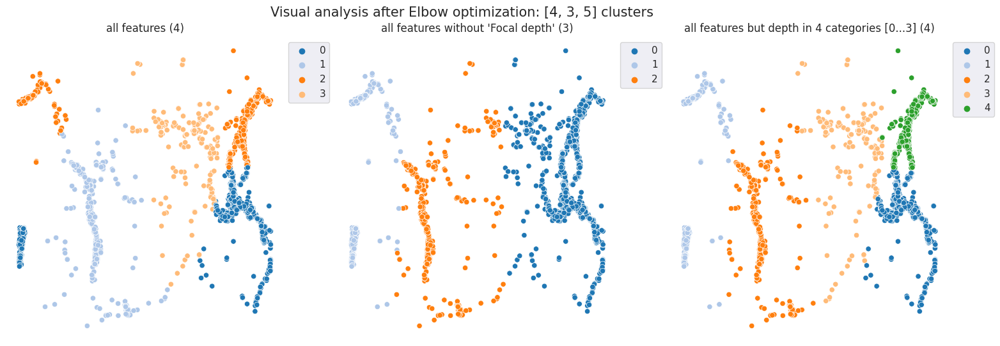

In [88]:
nr_clusters = [4, 3, 5]
df_dfcat = [df, df, df_with_cat]

fig = plt.figure(figsize=(19,6))
fig.subplots_adjust(hspace=0.4, top=0.9)
fig.suptitle("Visual analysis after Elbow optimization: [4, 3, 5] clusters", fontsize=15)

for i, clu_nr in enumerate(nr_clusters):
    plt.subplot(1, 3, i+1)
    kmeans = KMeans(n_clusters=clu_nr,
                    n_init='auto',
                    random_state=22).fit(df_box[i])
    df_dfcat[i]['Clusters'] = kmeans.labels_

    sns.scatterplot(x=df_dfcat[i]['Longitude'],
                    y=df_dfcat[i]['Latitude'],
                    hue=df_dfcat[i]['Clusters'],
                    palette='tab20',
#                    size=df['Richter'],
#                    sizes=(10,300),
                    legend='brief')
    plt.legend(loc=2,
               bbox_to_anchor=(1.0, 1.0))
    plt.title(feat_title[i])
    plt.axis('off')
plt.show()

The third looks much better, see below on the earth map:

In [44]:
fig = go.Figure(go.Scattermapbox(lat=df_dfcat[2].Latitude,
                                 lon=df_dfcat[2].Longitude,
                                 marker=dict(colorbar=dict(title="Clusters"),
                                             showscale=True, colorscale='Rainbow',
                                             color=df_dfcat[2].Clusters,
                                             size=10)))

fig.update_layout(title="K-Means clustering with depth-categories - 5 clusters", mapbox_style="carto-positron")

fig.show()

But result is realy no so appropriate.

.

#### 4.2.2. Silhouette optimization

Intuition for this formula is that point in separatable clusters are close to their cluster and far from others.

Silhoette score formula: $s(i) = \frac{b(i) - a(i)}{max\{a(i), b(i)\}}$.

$a(i)$ - mean distance between the point $x_i$ and all other points in the cluster of $x_i$, $b(i)$ - mean distance between point $x_i$ and all points from the closest cluster to $x_i$.

In [45]:
X=df_with_cat.loc[:, ['Longitude', 'Latitude', 'Richter', 'depth_cat_nr']]
range_n_clusters = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

for n_clusters in range_n_clusters:

    clusterer = KMeans(n_clusters=n_clusters,
                       init='k-means++',
                       n_init=10,
                       max_iter=300,
                       tol=1e-04,
                       random_state=22) #(n_components=n_clusters, covariance_type='full')
    cluster_labels=clusterer.fit_predict(X)
    cluster_labels.shape

    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", round(silhouette_avg, 3))

For n_clusters = 3 The average silhouette_score is : 0.66
For n_clusters = 4 The average silhouette_score is : 0.56
For n_clusters = 5 The average silhouette_score is : 0.514
For n_clusters = 6 The average silhouette_score is : 0.542
For n_clusters = 7 The average silhouette_score is : 0.575
For n_clusters = 8 The average silhouette_score is : 0.575
For n_clusters = 9 The average silhouette_score is : 0.578
For n_clusters = 10 The average silhouette_score is : 0.568
For n_clusters = 11 The average silhouette_score is : 0.574
For n_clusters = 12 The average silhouette_score is : 0.549
For n_clusters = 13 The average silhouette_score is : 0.527
For n_clusters = 14 The average silhouette_score is : 0.524
For n_clusters = 15 The average silhouette_score is : 0.516


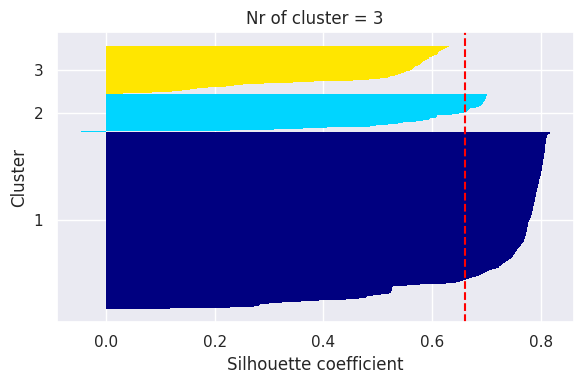

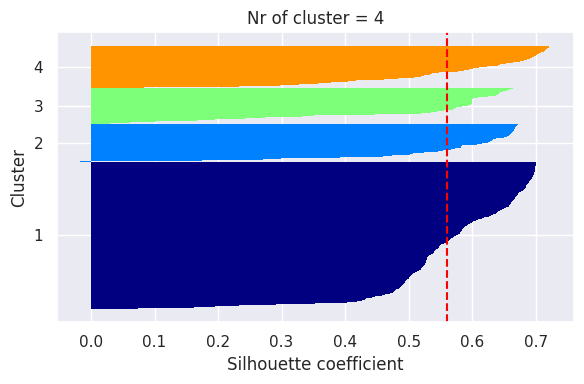

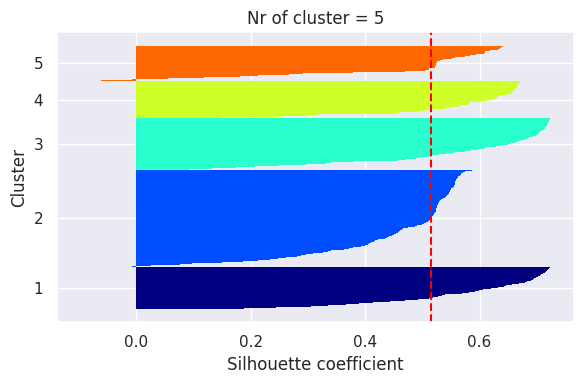

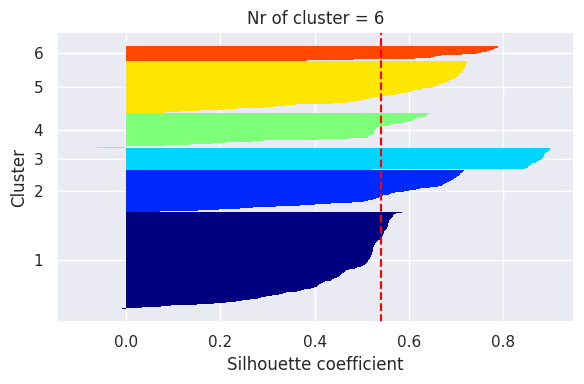

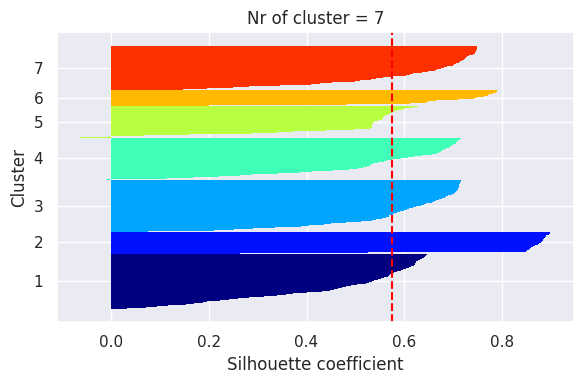

...

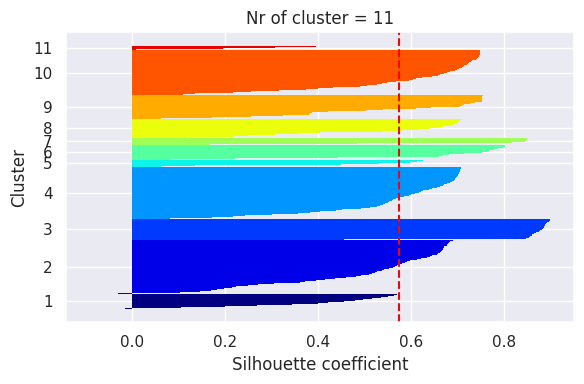

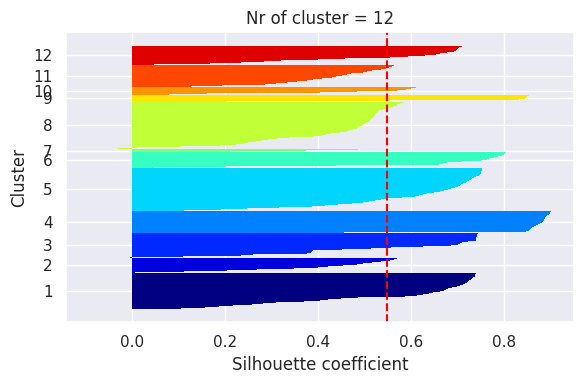

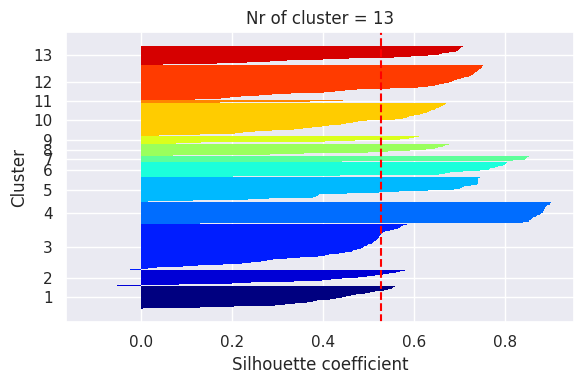

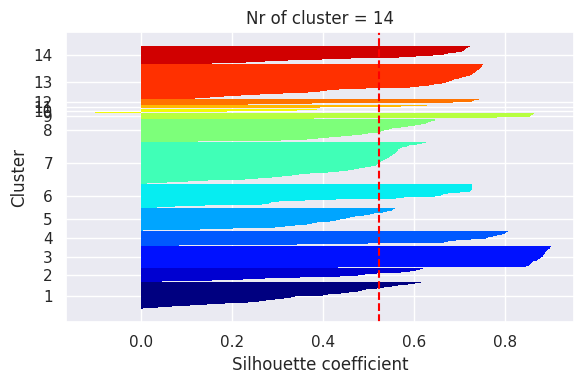

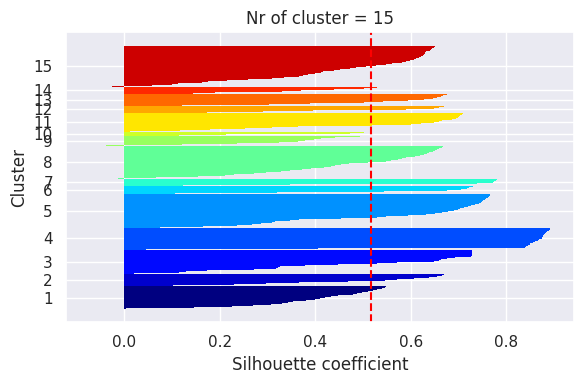

In [46]:
X = df_with_cat.loc[:, ['Longitude', 'Latitude', 'Richter', 'depth_cat_nr']]

for nr_clu in range_n_clusters:
    fig = plt.figure(figsize=(6,4))
    km = KMeans(n_clusters=nr_clu,
                init='k-means++',
                n_init=10,
                max_iter=300,
                tol=1e-04,
             random_state=22)
    y_km = km.fit_predict(X)
    cluster_labels = np.unique(y_km)
    n_clusters = cluster_labels.shape[0]
    silhouette_vals = silhouette_samples(X, y_km, metric='euclidean')
    y_ax_lower, y_ax_upper = 0, 0
    yticks = []
    for i, c in enumerate(cluster_labels):
        c_silhouette_vals = silhouette_vals[y_km == c]
        c_silhouette_vals.sort()
        y_ax_upper += len(c_silhouette_vals)
        color = cm.jet(float(i) / n_clusters)
        plt.barh(range(y_ax_lower, y_ax_upper), c_silhouette_vals, height=1.0,
                edgecolor='none', color=color)
        yticks.append((y_ax_lower + y_ax_upper) / 2.)
        y_ax_lower += len(c_silhouette_vals)

    silhouette_avg = np.mean(silhouette_vals)
    plt.axvline(silhouette_avg, color="red", linestyle="--")
    plt.yticks(yticks, cluster_labels + 1)
    plt.ylabel('Cluster')
    plt.xlabel('Silhouette coefficient')
    plt.title(f'Nr of cluster = {nr_clu}')
    plt.tight_layout()
    plt.show()

Maximum score for 9 clusters with silhouette score = 0.578.

What can Silhouette graphs say us? It is difficult to find such a graph where the clusters would have approximately the same width. This is due to the hetergeneous distribution of earthquake sites. May be 7 or 10 or another?.. It's difficult to take smt usefull here.

.

#### 4.2.3. GaussianMixture - try to do smt with it

In [47]:
# Labeling the clusters
#    centers = clusterer.means_

In [48]:
# Based on https://scikit-learn.org/stable/auto_examples/mixture/plot_gmm_init.html#sphx-glr-download-auto-examples-mixture-plot-gmm-init-py

X = df_with_cat.loc[:, ['Longitude', 'Latitude', 'Richter', 'depth_cat_nr']]
range_n_clusters = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

def get_initial_means(X, init_params, r, n_comp):
    # Run a GaussianMixture with max_iter=0 to output the initalization means
    gmm = GaussianMixture(n_components=n_comp,
                          init_params=init_params,
                          tol=1e-9,
                          max_iter=1000,
                          random_state=r).fit(X)
    return gmm.means_

for n_clusters in range_n_clusters:

    r = np.random.RandomState(seed=22)
    ini = get_initial_means(X, 'kmeans', r, n_clusters)
    clusterer = GaussianMixture(n_components=n_clusters,
                                covariance_type='diag',
                                n_init=50,
                                max_iter=2000,
                                means_init=ini,
                                random_state=22) #, init_params='k-means++')
    cluster_labels=clusterer.fit_predict(X)
    cluster_labels.shape
#    label = clusterer.labels_
#    centroids = clusterer.clusterer.means_

    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", round(silhouette_avg, 3))

For n_clusters = 3 The average silhouette_score is : -0.209
For n_clusters = 4 The average silhouette_score is : -0.261
For n_clusters = 5 The average silhouette_score is : -0.35
For n_clusters = 6 The average silhouette_score is : -0.361
For n_clusters = 7 The average silhouette_score is : -0.425
For n_clusters = 8 The average silhouette_score is : -0.333
For n_clusters = 9 The average silhouette_score is : -0.473
For n_clusters = 10 The average silhouette_score is : -0.266
For n_clusters = 11 The average silhouette_score is : -0.361
For n_clusters = 12 The average silhouette_score is : -0.187
For n_clusters = 13 The average silhouette_score is : -0.265
For n_clusters = 14 The average silhouette_score is : -0.254
For n_clusters = 15 The average silhouette_score is : -0.333


Maximum scores is -0.473 (9 clusters) with GaussianMixture method.

.

# **5. Clustering models for FOUR DEPTH-CLASSes**

### 5.1. KMeans clustering

#### 5.1.1. Create new dataframes for four depth-types

In [49]:
features_cat = ['Longitude', 'Longitude_50', 'Latitude', 'Richter', 'xx', 'yy', 'zz']

df_0 = df_with_cat[df_with_cat['depth_cat_nr'] == 0].loc[:, features_cat]
df_1 = df_with_cat[df_with_cat['depth_cat_nr'] == 1].loc[:, features_cat]
df_2 = df_with_cat[df_with_cat['depth_cat_nr'] == 2].loc[:, features_cat]
df_3 = df_with_cat[df_with_cat['depth_cat_nr'] == 3].loc[:, features_cat]

In [50]:
df_0.shape, df_1.shape, df_2.shape, df_3.shape

((144, 7), (1509, 7), (404, 7), (120, 7))

In [51]:
# Some manipulations with depth-classes

fig = plt.figure(figsize=(15,12))
fig.subplots_adjust(hspace=0.4, top=0.9)
fig.suptitle("The Elbow Method using Inertia with all features and without 'Focal depth'", fontsize=15)

# depth-classes in one list

df_0123 = [df_0, df_1, df_2, df_3]

# depth-classes in one list with 3 features including offset (-50 longitude)

df_0123_50 = [df_0.loc[:, ['Longitude_50', 'Latitude', 'Richter']],
              df_1.loc[:, ['Longitude_50', 'Latitude', 'Richter']],
              df_2.loc[:, ['Longitude_50', 'Latitude', 'Richter']],
              df_3.loc[:, ['Longitude_50', 'Latitude', 'Richter']]]

features_xyz = ['xx', 'yy', 'zz']

df_0123_xyz = [df_0.loc[:, features_xyz],
               df_1.loc[:, features_xyz],
               df_2.loc[:, features_xyz],
               df_3.loc[:, features_xyz]]

<Figure size 1500x1200 with 0 Axes>

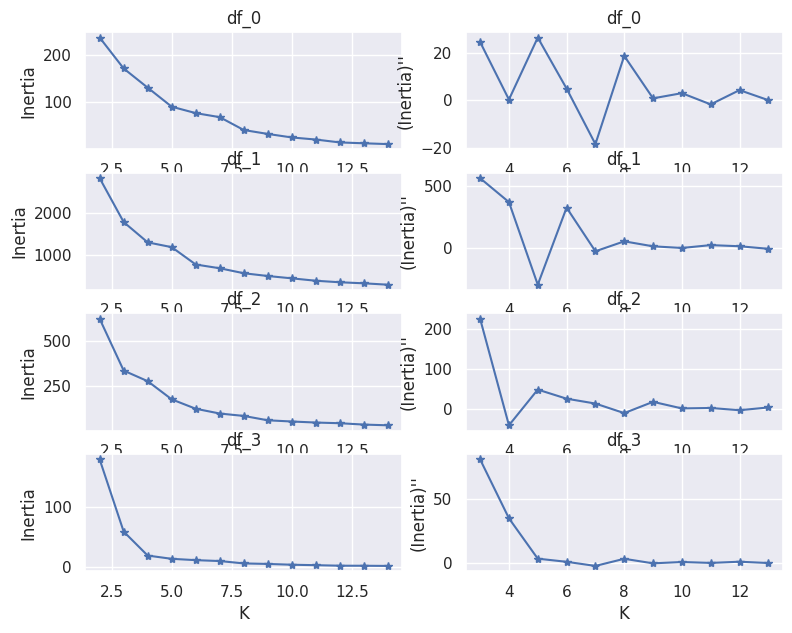

In [89]:
# Finding the optimal K using the elbow method

feat_title = ['df_0', 'df_1', 'df_2', 'df_3']

for i, dfs in enumerate(df_0123):
#    fig = plt.figure(figsize=(15,8))

    plt.subplot(4, 2, 2*i+1)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(dfs.loc[:, features_xyz]) #['Longitude_50', 'Latitude', 'Richter']])
    inertias = []
    cluster_range = range(2,15)
    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters,
                        n_init='auto',
                        random_state=22)
        cluster_labels = kmeans.fit_predict(X_scaled)
        inertias.append(kmeans.inertia_)
    plt.title(feat_title[i])
    plt.xlabel('K')
    plt.ylabel('Inertia')
    plt.plot(cluster_range, inertias, marker="*")

    plt.subplot(4, 2, 2*i+2)

    y = np.zeros(len(inertias) - 2)
    for j in range(len(inertias) - 2):
        y[j] = inertias[j] +  inertias[j + 2] - 2 *inertias[j + 1]
    plt.title(feat_title[i])
    plt.xlabel('K')
    plt.ylabel("(Inertia)''")
    plt.plot(cluster_range[1:-1],y, marker="*")

plt.show()

Optimal nr of clusters for 4-classes = [3, 3, 5, 4]. Update for xyz coord: [3, 3, 3, 3]. This method is not very suitable due to the fact that a small number of clusters for a complex pattern of earthquakes.

.

#### 5.1.2. Clusters on earth map (optimal n_clusters)

In [53]:
#n_clu_0123 = [3, 3, 5, 4]
n_clu_0123 = [3, 3, 3, 3]
labels_pred_kmeans = []

for i, dfi in enumerate(df_0123):
    #kmeans = KMeans(n_clusters=n_clu_0123[i], random_state=22).fit(dfi.loc[:, ['Longitude_50', 'Latitude', 'Richter']])
    kmeans = KMeans(n_clusters=n_clu_0123[i],
                    n_init='auto',
                    random_state=22).fit(dfi.loc[:, ['xx', 'yy', 'zz']])
    dfi['Clusters'] = kmeans.labels_
    labels_pred_kmeans.append(kmeans.labels_)

<Figure size 2200x1000 with 0 Axes>

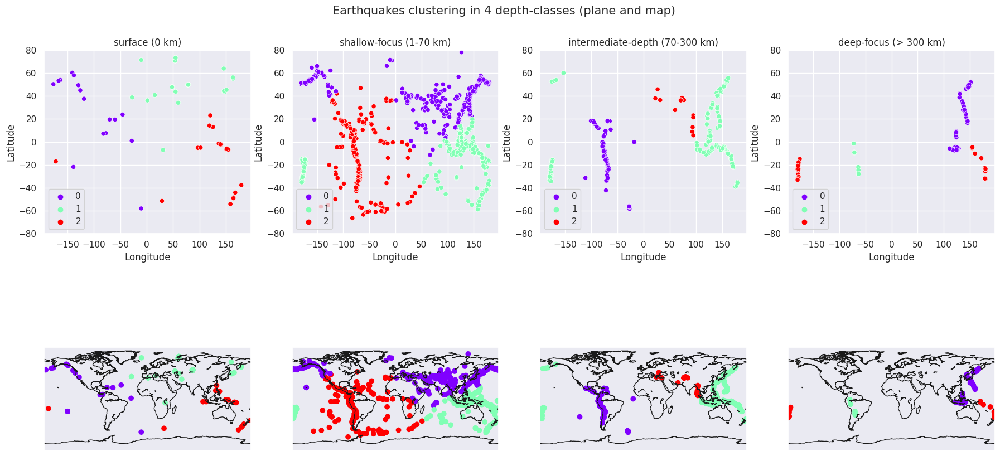

In [54]:
# Plot graphs for K-Means clustering

scatters_4x2_graphs(df_0123)

Yes, indeed, the number of clusters is not enough for a world map after elbow method.

.

#### 5.1.3. GridSearchCV

Results after applying GridSearchCV are below for every depth-class. In all cases nr of classes was selected as maximum. So this type of optimization is not suitable.

- 0: {'max_iter': 100, 'n_clusters': 17, 'n_init': 10, 'tol': 1}
- 1: {'max_iter': 200, 'n_clusters': 17, 'n_init': 20, 'tol': 1e-05}
- 2: {'max_iter': 200, 'n_clusters': 17, 'n_init': 20, 'tol': 1e-05}
- 3: {'max_iter': 200, 'n_clusters': 17, 'n_init': 15, 'tol': 0.01}

CPU times: user 1.48 s, sys: 150 ms, total: 1.63 s
Wall time: 51 s

{'max_iter': 300, 'n_clusters': 40, 'n_init': 15, 'tol': 10}

In [55]:
'''%%time

from sklearn.model_selection import GridSearchCV

# Dictionary of hyperparameters to iterate through
# GridSearchCV will try every combination of these hyperparameters and
# return the model with the best score via KFold validation
hyperparams = {
    "n_clusters": [5, 15, 25, 40],
    "n_init": [10, 15, 20],
    "max_iter": [100, 200, 300],
    "tol": [.01, 1, 10, 100, 1000],
}

k_meanss = KMeans()  # sets jobs equal to number of cores

ensemble = GridSearchCV(
    estimator=k_meanss,
    param_grid=hyperparams,
    cv=5,
    n_jobs=-1
)

ensemble.fit(df_0.loc[:, ['Longitude_50', 'Latitude', 'Richter']])

ensemble.best_params_'''

'%%time\n\nfrom sklearn.model_selection import GridSearchCV\n\n# Dictionary of hyperparameters to iterate through\n# GridSearchCV will try every combination of these hyperparameters and\n# return the model with the best score via KFold validation\nhyperparams = {\n    "n_clusters": [5, 15, 25, 40],\n    "n_init": [10, 15, 20],\n    "max_iter": [100, 200, 300],\n    "tol": [.01, 1, 10, 100, 1000],\n}\n\nk_meanss = KMeans()  # sets jobs equal to number of cores\n\nensemble = GridSearchCV(\n    estimator=k_meanss,\n    param_grid=hyperparams,\n    cv=5,\n    n_jobs=-1\n)\n\nensemble.fit(df_0.loc[:, [\'Longitude_50\', \'Latitude\', \'Richter\']])\n\nensemble.best_params_'

.

### 5.2. DBSCAN clustering

#### 5.2.1. Optimal eps (NearestNeighbors)

Amount of hyperparameters combinations: 2000


  0%|          | 0/2000 [00:00<?, ?it/s]

{'3_1.2709999999999997_3': (1.2709999999999997, 3), '3_1.2809999999999997_3': (1.2809999999999997, 3), '3_1.2909999999999997_3': (1.2909999999999997, 3), '3_1.3009999999999997_2': (1.3009999999999997, 2), '3_1.3109999999999997_2': (1.3109999999999997, 2), '3_1.3209999999999997_2': (1.3209999999999997, 2)}


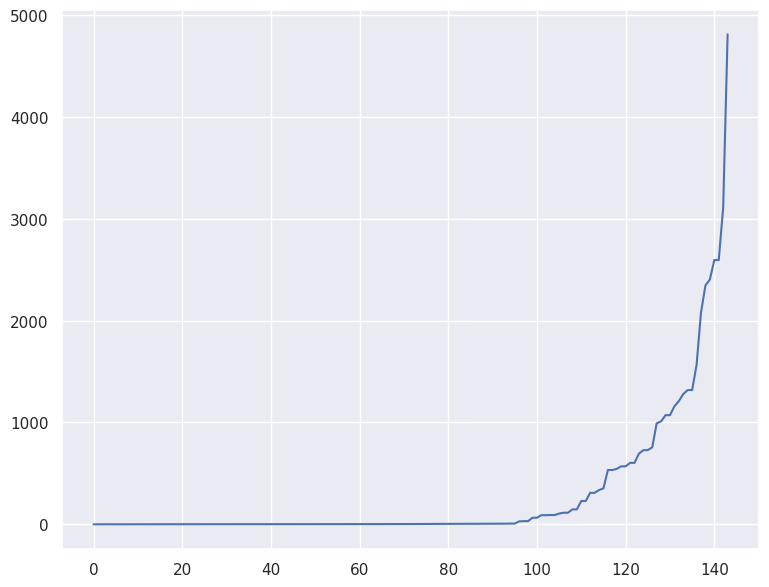

Amount of hyperparameters combinations: 2000


  0%|          | 0/2000 [00:00<?, ?it/s]

{'3_0.6409999999999999_2': (0.6409999999999999, 2), '3_0.6409999999999999_3': (0.6409999999999999, 3), '3_0.6509999999999999_2': (0.6509999999999999, 2), '3_0.6509999999999999_3': (0.6509999999999999, 3), '3_0.6609999999999999_2': (0.6609999999999999, 2), '3_0.6609999999999999_3': (0.6609999999999999, 3), '3_0.6709999999999999_2': (0.6709999999999999, 2), '3_0.6709999999999999_3': (0.6709999999999999, 3), '3_0.6809999999999999_2': (0.6809999999999999, 2), '3_0.6809999999999999_3': (0.6809999999999999, 3), '3_0.691_2': (0.691, 2), '3_0.691_3': (0.691, 3), '3_0.7009999999999998_2': (0.7009999999999998, 2), '3_0.7009999999999998_3': (0.7009999999999998, 3), '3_0.7109999999999999_2': (0.7109999999999999, 2), '3_0.7109999999999999_3': (0.7109999999999999, 3), '3_0.7209999999999999_2': (0.7209999999999999, 2), '3_0.7209999999999999_3': (0.7209999999999999, 3), '3_0.7309999999999999_2': (0.7309999999999999, 2), '3_0.7309999999999999_3': (0.7309999999999999, 3), '3_0.7409999999999999_2': (0.74

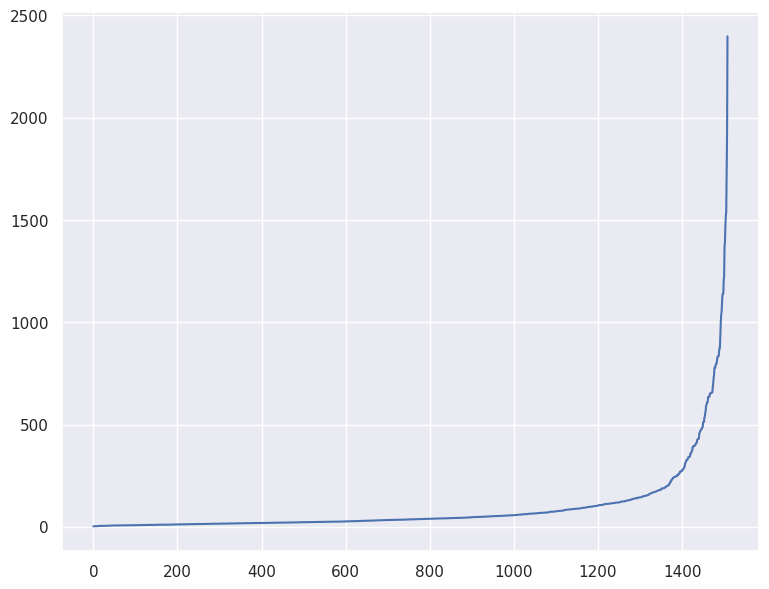

Amount of hyperparameters combinations: 2000


  0%|          | 0/2000 [00:00<?, ?it/s]

{'3_0.8309999999999998_2': (0.8309999999999998, 2), '3_0.8309999999999998_3': (0.8309999999999998, 3), '3_0.8409999999999999_2': (0.8409999999999999, 2), '3_0.8409999999999999_3': (0.8409999999999999, 3), '3_0.8509999999999999_2': (0.8509999999999999, 2), '3_0.8509999999999999_3': (0.8509999999999999, 3), '3_0.8609999999999999_2': (0.8609999999999999, 2), '3_0.8609999999999999_3': (0.8609999999999999, 3), '3_0.8709999999999999_2': (0.8709999999999999, 2), '3_0.8709999999999999_3': (0.8709999999999999, 3), '3_0.8809999999999999_2': (0.8809999999999999, 2), '3_0.8809999999999999_3': (0.8809999999999999, 3), '3_0.8909999999999999_2': (0.8909999999999999, 2), '3_0.8909999999999999_3': (0.8909999999999999, 3), '3_0.9009999999999999_2': (0.9009999999999999, 2), '3_0.9009999999999999_3': (0.9009999999999999, 3), '3_0.9109999999999998_2': (0.9109999999999998, 2), '3_0.9109999999999998_3': (0.9109999999999998, 3), '3_0.9209999999999998_2': (0.9209999999999998, 2), '3_0.9209999999999998_3': (0.9

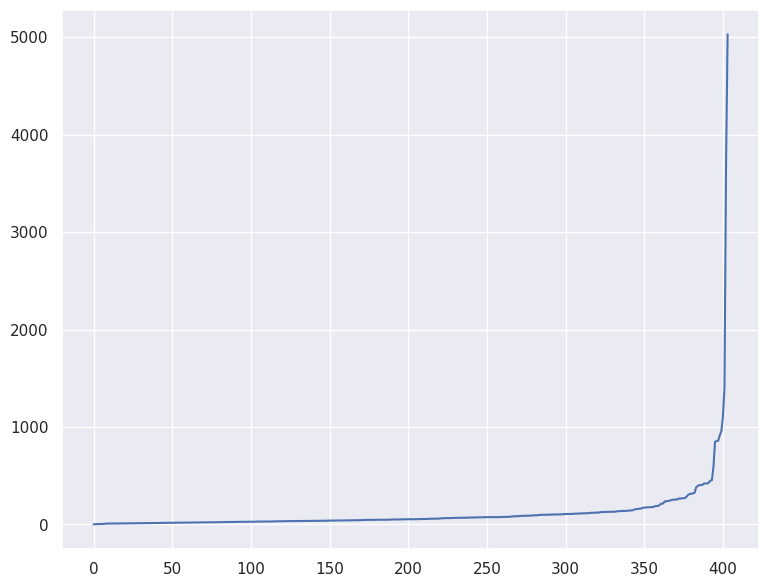

Amount of hyperparameters combinations: 2000


  0%|          | 0/2000 [00:00<?, ?it/s]

{'3_0.8409999999999999_2': (0.8409999999999999, 2), '3_0.8409999999999999_3': (0.8409999999999999, 3), '3_0.8509999999999999_2': (0.8509999999999999, 2), '3_0.8509999999999999_3': (0.8509999999999999, 3), '3_0.8609999999999999_2': (0.8609999999999999, 2), '3_0.8609999999999999_3': (0.8609999999999999, 3), '3_0.8709999999999999_2': (0.8709999999999999, 2), '3_0.8709999999999999_3': (0.8709999999999999, 3), '3_0.8809999999999999_2': (0.8809999999999999, 2), '3_0.8809999999999999_3': (0.8809999999999999, 3), '3_0.8909999999999999_2': (0.8909999999999999, 2), '3_0.8909999999999999_3': (0.8909999999999999, 3), '3_0.9009999999999999_2': (0.9009999999999999, 2), '3_0.9009999999999999_3': (0.9009999999999999, 3), '3_0.9109999999999998_2': (0.9109999999999998, 2), '3_0.9109999999999998_3': (0.9109999999999998, 3), '3_0.9209999999999998_2': (0.9209999999999998, 2), '3_0.9209999999999998_3': (0.9209999999999998, 3), '3_0.9309999999999998_2': (0.9309999999999998, 2), '3_0.9309999999999998_3': (0.9

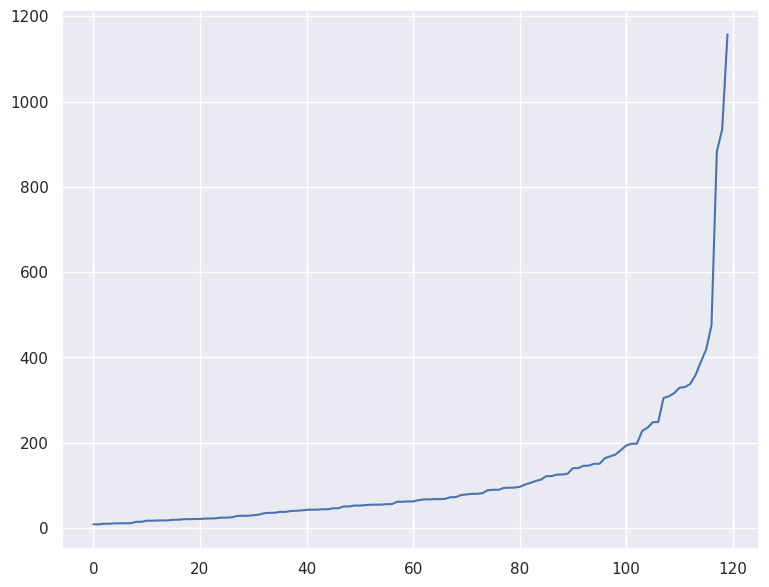

In [56]:
for i, dfs in enumerate(df_0123):
    scaler = StandardScaler()
    #X_scaled = scaler.fit_transform(dfs.loc[:, ['Longitude_50', 'Latitude', 'Richter']])
    X_scaled = scaler.fit_transform(dfs.loc[:, features_xyz])
    X_scaled.shape
#    X_scaled = dfs.loc[:, ['Longitude_50', 'Latitude', 'Richter']]

    epsilon_param_options = np.arange(0.001, 10, 0.01)
    min_samples_param_options = np.arange(2, X_scaled.shape[1]+1, 1)
    param_grid = itertools.product(epsilon_param_options, min_samples_param_options)

    print('Amount of hyperparameters combinations: {}'.format(len(epsilon_param_options) * len(min_samples_param_options)))

    from tqdm.notebook import tqdm as tqdm
    from sklearn.cluster import DBSCAN

    params_dict = {}

    for param_set in tqdm(param_grid, total=len(epsilon_param_options) * len(min_samples_param_options)):
        dbscan = DBSCAN(eps=param_set[0], min_samples=param_set[1])

        y_dbscan = dbscan.fit_predict(X_scaled)

        if len(set(y_dbscan) - set([-1])) == 3:
            params_dict['{}_{}_{}'.format(len(set(y_dbscan) - set([-1])), param_set[0], param_set[1])] = param_set

    print(params_dict)

    from sklearn.neighbors import NearestNeighbors

    neighbours = NearestNeighbors(n_neighbors=10)

    nbrs = neighbours.fit(dfs.loc[:, features_xyz]) #['Longitude_50', 'Latitude', 'Richter']])
    distances, indices = nbrs.kneighbors(dfs.loc[:, features_xyz]) #['Longitude_50', 'Latitude', 'Richter']])

    distances = np.sort(distances, axis=0)
    distances = distances[:,1]
    plt.plot(distances)
    plt.grid(True)
    plt.show()

Optimal eps = [7, 2, 4, 2] - points of greatest steepness of the graph. Update for xyz-coords: [800, 250, 400, 300]

.

#### 5.2.2. Clusters on earth map (optimal eps)

<Figure size 2200x1000 with 0 Axes>

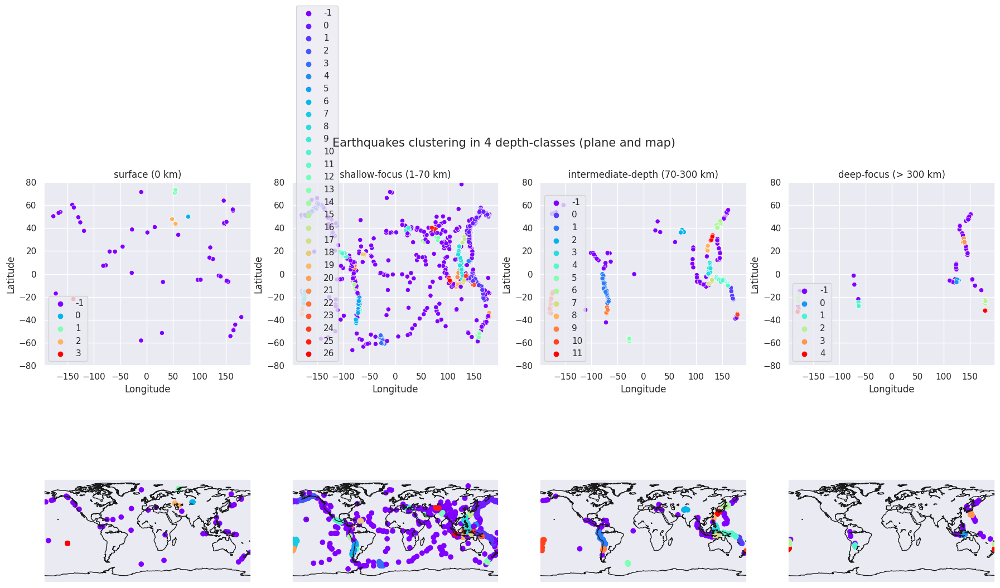

In [57]:
#epsilons = [7, 2, 4, 2]
epsilons = [800, 250, 400, 300]
labels_pred_dbscan = []

for i, dfi in enumerate(df_0123):
    estimator = DBSCAN(eps=epsilons[i], min_samples=7, metric='euclidean')
    X = dfi.loc[:, features_xyz]
    estimator.fit(X)
    dfi['Clusters'] = estimator.labels_
    labels_pred_dbscan.append(estimator.labels_)

scatters_4x2_graphs(df_0123)

These optimal (eps)s - are too small for correct clustering - too much outliers.

May be there is a problem with scaling.

<Figure size 2200x1000 with 0 Axes>

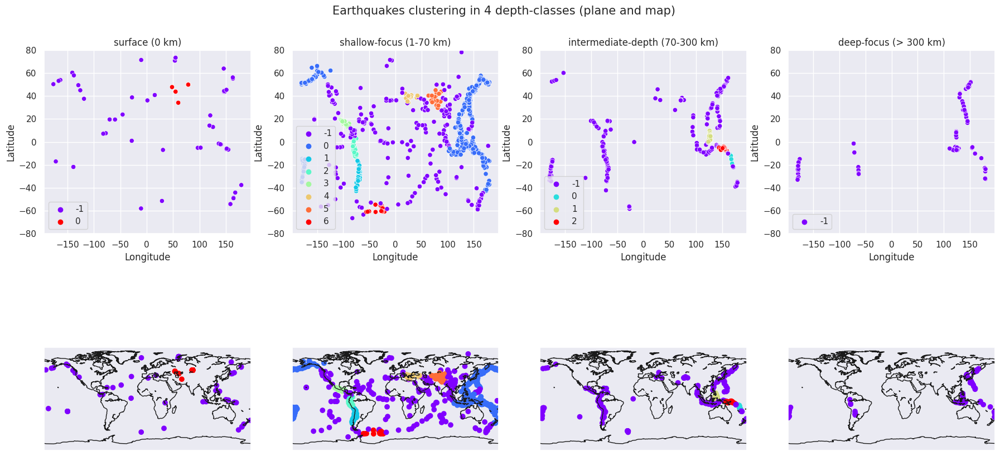

In [58]:
epsilons = [2000, 1000, 500, 500]
#min_samp = [10, 10, 10, 10]

for i, dfi in enumerate(df_0123):
    estimator = DBSCAN(eps=epsilons[i], min_samples=30, metric='euclidean')
    X = dfi.loc[:, features_xyz] #['Longitude_50', 'Latitude', 'Richter']]
    estimator.fit(X)
    dfi['Clusters'] = estimator.labels_

scatters_4x2_graphs(df_0123)

Clustering is some better, but too much outlier. NearestNeighbors didn't help to DBSCAN.

.

#### 5.2.3. Clusters for all classes

In [59]:
estimator_dbscan = DBSCAN(eps=350, min_samples=10, metric='euclidean')
X = df_with_cat.loc[:, features_xyz]
estimator_dbscan.fit(X)

df_with_cat['Clusters_dbscan'] = estimator_dbscan.labels_
print('Nr of clusters for DBSCAN:', df_with_cat['Clusters_dbscan'].max())

Nr of clusters for DBSCAN: 16


Nr of clusters 16, but manually found eps and min_samples. Sometimes it was 34 clusters, but clustering was not good too.

In [60]:
def to_int_size(value):
        return np.exp(value)**(1/3)

fig = go.Figure(go.Scattermapbox(lat=df_with_cat['Latitude'],
                                 lon=df_with_cat['Longitude'],
                                 marker=dict(colorbar=dict(title="Clusters_dbscan"),
                                             showscale=True,
                                             colorscale='Rainbow',
                                             color=df_with_cat['Clusters_dbscan'])))

fig.update_layout(mapbox_style="carto-positron")
fig.show()
# open-street-map
# stamen-terrain
# carto-darkmatter
# carto-positron
# stamen-toner
# stamen-watercolor

Conclusions below

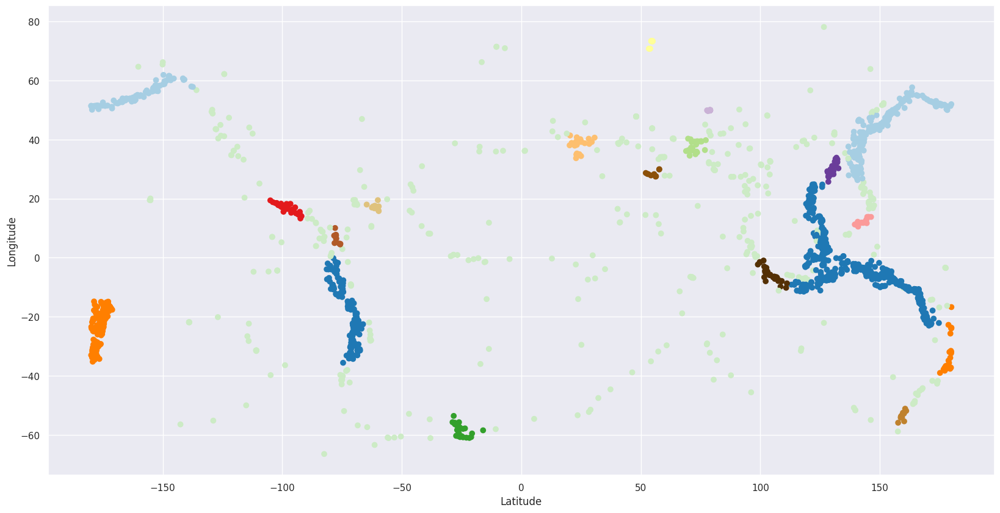

In [61]:
def set_colors(labels,
               colors=['#a6cee3','#1f78b4','#1f78b4','#b2df8a','#33a02c',
                       '#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6',
                       '#6a3d9a','#ffff99','#b15928','#543005','#8c510a',
                       '#bf812d','#dfc27d','#f6e8c3','#f5f5f5','#c7eae5',
                       '#80cdc1','#35978f','#01665e','#003c30','#40004b',
                       '#762a83','#9970ab','#c2a5cf','#e7d4e8','#f7f7f7',
                       '#d9f0d3','#a6dba0','#5aae61','#1b7837','#00441b',
                       '#8dd3c7','#ffffb3','#bebada','#fb8072','#80b1d3',
                       '#fdb462','#b3de69','#fccde5','#d9d9d9','#bc80bd',
                       '#ccebc5']):
    colored_labels = []
    for label in labels:
        colored_labels.append(colors[label])
    return colored_labels


estimator = DBSCAN(eps=350, min_samples=10, metric='euclidean')
X = df_with_cat.loc[:, features_xyz] #['Longitude', 'Latitude', 'Richter', 'depth_cat_nr']]
estimator.fit(X)
# Clusters are given in the labels attribute
labels = estimator.labels_
colors = set_colors(labels)
plt.figure(figsize=(20,10))
plt.scatter(df_with_cat["Longitude"], df_with_cat["Latitude"],c=colors)
plt.xlabel("Latitude")
plt.ylabel("Longitude")
plt.show()

Conclusions below

In [62]:
!pip install -U -q Basemap
from mpl_toolkits.basemap import Basemap

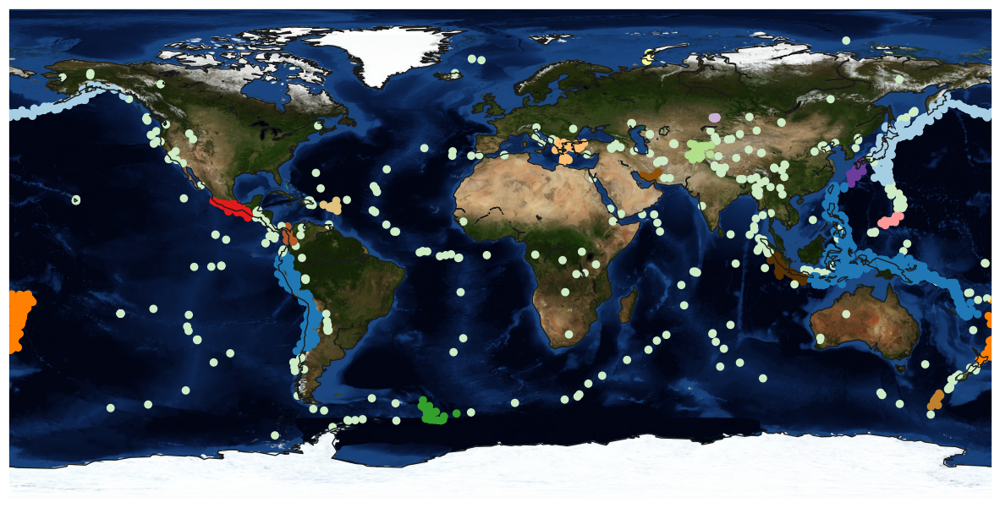

In [63]:
plt.figure(figsize=(15,10))
m = Basemap() #resolution='i')
m.bluemarble()
#m.etopo()
m.drawcoastlines()
m.scatter(y=df_with_cat['Latitude'], x=df_with_cat['Longitude'], color=colors) #,5,marker='o',color='b')
#m.arcgisimage(service='World_Shaded_Relief', xpixels = 5000, verbose=False)
#m.arcgisimage(xpixels = 3000, verbose=False)
plt.show()

Manual parameters eps=350 and min_samples=10 for DBSCAN are better than after optimization.

.

#### 5.2.4. DBSCAN with haversine



<Figure size 2200x1000 with 0 Axes>

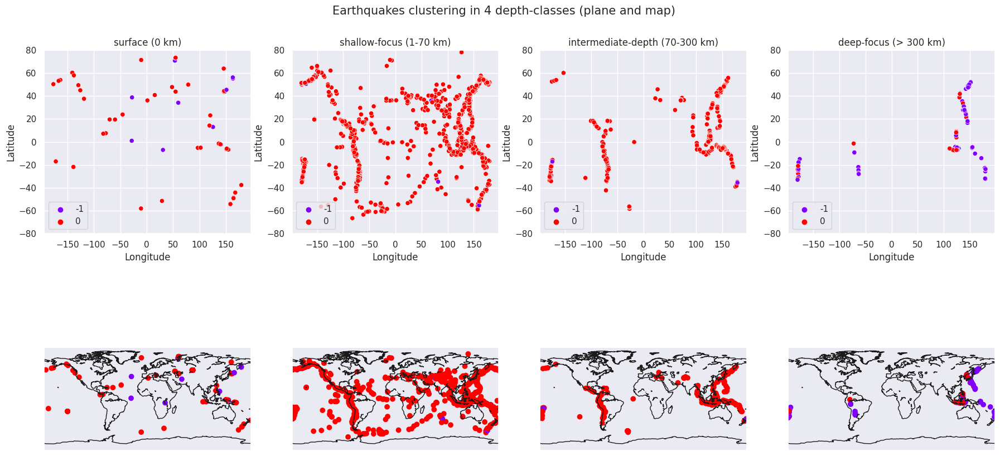

In [64]:
epsilons = [0.7, 0.2, 0.4, 0.2]
labels_pred_dbscan = []

for i, dfi in enumerate(df_0123):
    estimator = DBSCAN(eps=epsilons[i], min_samples=10, algorithm='ball_tree', metric='haversine')
    X = dfi.loc[:, ['Longitude_50', 'Latitude']] #, 'Richter']]
    estimator.fit(X)
    dfi['Clusters'] = estimator.labels_
    labels_pred_dbscan.append(estimator.labels_)

scatters_4x2_graphs(df_0123)

The result is impossibly unsatisfactory. There is no clustering.

.

#### 5.2.5. DBSCAN with 3D coordinates (without classes)

In [65]:
# convert to 3D Cartesian + mahalanobis (?)

In [66]:
data = []
trans_GPS_to_XYZ = Transformer.from_crs(4979, 4978, always_xy=True)

for i in range(len(df['Longitude'])):
    xx, yy, zz = trans_GPS_to_XYZ.transform(df['Longitude'][i], df['Latitude'][i], 0)
    data.append([xx/1000, yy/1000, zz/1000])
data = np.array(data)
data

array([[ 3444.53558261,  1854.6913204 , -5020.56273973],
       [-3911.92383086,  2174.66682745,  4528.80559352],
       [-3788.98927115,  2878.08456241,  4233.20788923],
       ...,
       [-4291.20648708,  3663.74148476,  2963.7775259 ],
       [-3991.69827987,  3234.72125005,  3766.68757981],
       [-3108.74250677,  4930.87176387,  2580.30692078]])

In [67]:
# Source:
# https://stackoverflow.com/questions/56062673/clustering-the-3d-points-when-given-the-x-y-z-coordinates-using-dbscan-algorithm

#fig = plt.figure()
#ax = Axes3D(fig)
#ax.scatter(data[:,0], data[:,1], data[:,2], s=50)
#ax.view_init(azim=200)
#plt.show()

model = DBSCAN(eps=1e3, min_samples=20) # Manual parameters
model.fit_predict(data)
#pred = model.fit_predict(data)

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(data[:,0], data[:,1], data[:,2], c=model.labels_, cmap='rainbow', s=50)
ax.view_init(azim=200)
ax.legend(list(np.unique(model.labels_)))
#ax.grid(True)
plt.show()

print("number of cluster found: {}".format(len(set(model.labels_))))
print('cluster for each point: ', model.labels_)

<Figure size 900x700 with 0 Axes>

number of cluster found: 9
cluster for each point:  [-1  0  0 ...  0  0  0]


Total nr of clusters is 9, but many outliers.

.

### 5.3. Agglomerative clustering

#### 5.3.1. Optimal nr of clusters Agglo

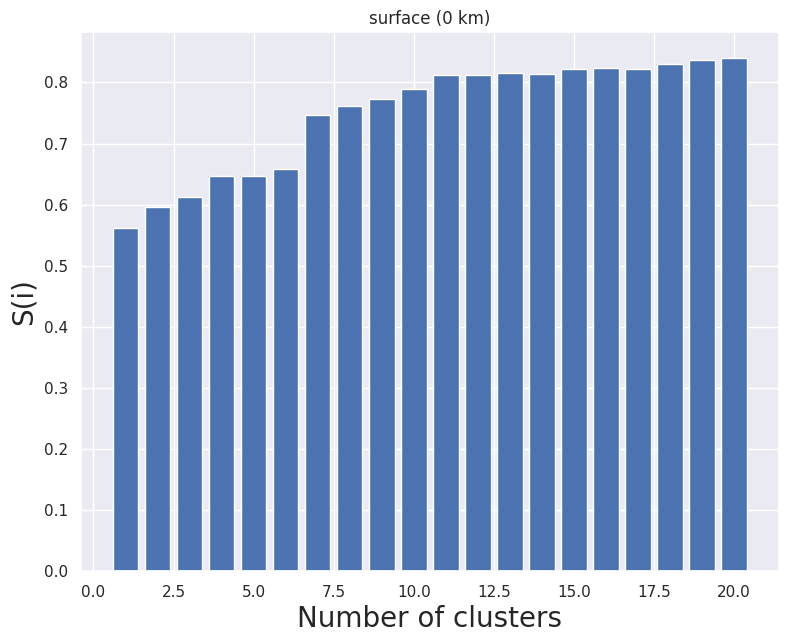

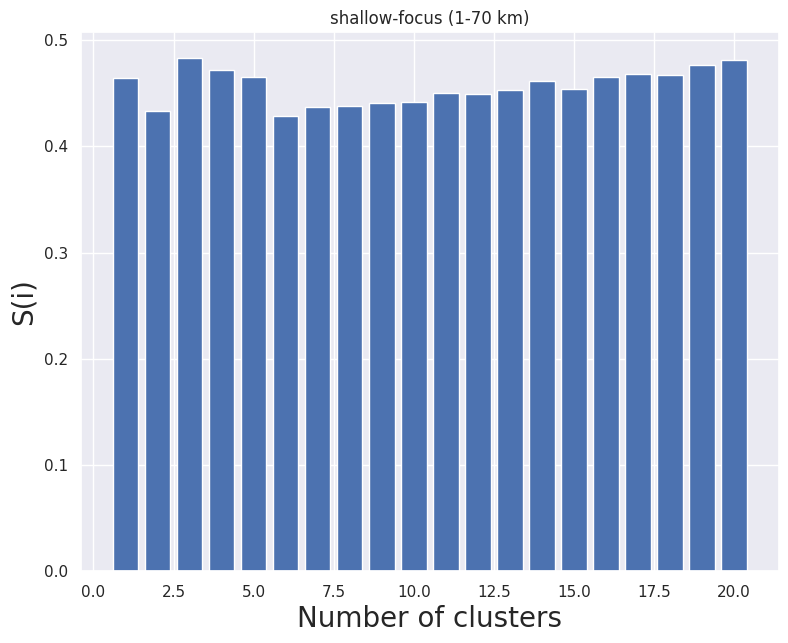

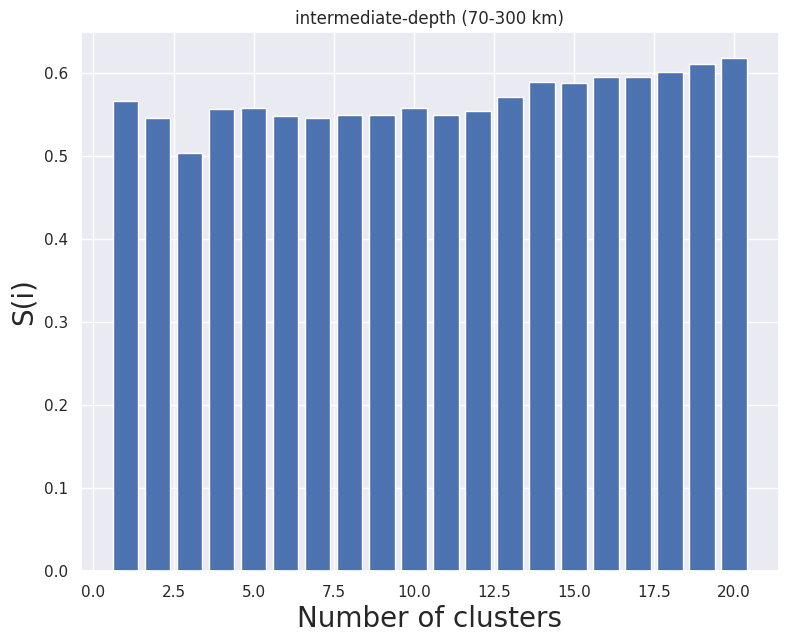

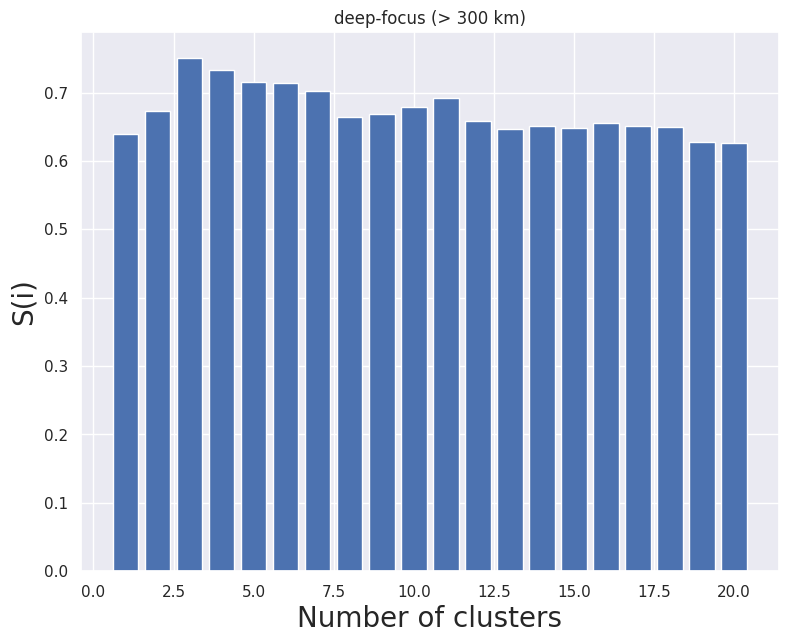

In [68]:
for i, dfs in enumerate(df_0123):

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(dfs.loc[:, features_xyz])

# Normalizing the data so that the data approximately follows a Gaussian distribution
# X_normalized = normalize(X_scaled)

# pca = PCA(n_components = 2)
# X_principal = pca.fit_transform(X_normalized)


# Appending the silhouette scores of the different models to the list

    silhouette_scores = []
    k = []
    for j in range(20):
        ac = AgglomerativeClustering(n_clusters = j+2)
        c = ac.fit_predict(X_scaled)
        silhouette_scores.append(silhouette_score(X_scaled, ac.fit_predict(X_scaled)))
        k.append(j+1)

# Plotting a bar graph to compare the results

    plt.bar(k, silhouette_scores)
    plt.xlabel('Number of clusters', fontsize = 20)
    plt.ylabel('S(i)', fontsize = 20)
    plt.title(title_depth[i])
    plt.show()

The first histogram shows increasing since the 5th cluster - it looks like overfitting.

Optimal nr of cluster: [4, 10, 4, 3]. Update with xyz-coords: [6, 11, 4, 3]

.

#### 5.3.2. Clusters on earth map (optimal n_clusters)

Nr of clusters for Agglomerative: 6
Nr of clusters for Agglomerative: 11
Nr of clusters for Agglomerative: 5
Nr of clusters for Agglomerative: 4


<Figure size 2200x1000 with 0 Axes>

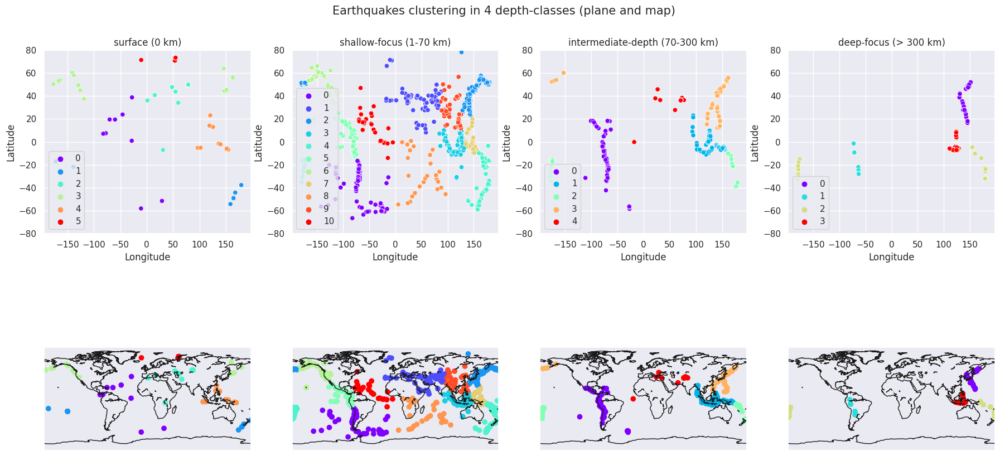

In [69]:
#nr_clu = [4, 10, 4, 3]
#nr_clu = [6, 11, 4, 3]
nr_clu = [6, 11, 5, 4]
labels_true_agglo = []

for i, dfi in enumerate(df_0123):
    estimator_agglo = AgglomerativeClustering(n_clusters=nr_clu[i])
    X = dfi.loc[:, features_xyz] # ['Longitude_50', 'Latitude', 'Richter']]
    estimator_agglo.fit(X)

    # df.loc[:, ['Longitude', 'Latitude', 'Focal depth', 'Richter']]
    dfi['Clusters'] = estimator_agglo.labels_
    print('Nr of clusters for Agglomerative:', dfi['Clusters'].max() + 1)
    labels_true_agglo.append(estimator_agglo.labels_)

scatters_4x2_graphs(df_0123)

Such clustering is much better, but in different classes - different boundaries of clusters - it's not logical. Perhaps it's necessary to change the nr of clusters between the classes.

.

#### 5.3.3. Dendrogram

The height in a dendrogram at which two clusters join is the distance between the two clusters in data space.

In [70]:
def plot_dendrogram(model, title_depth, **kwargs):
    """Create linkage matrix and then plot the dendrogram"""
    # create the counts of samples under each node

    plt.figure(figsize=(30, 10))
    plt.title('Hierarchical Clustering Dendrogram')

    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
    counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_,
                                      model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    plt.xlabel("Number of points in node (or index of point if no parenthesis).")
    plt.xticks(fontsize=20, rotation=70)
    plt.title(title_depth)
    plt.show()

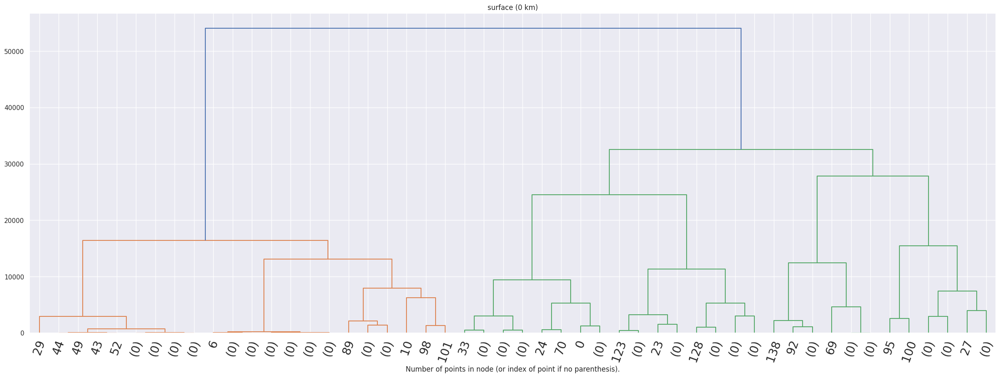

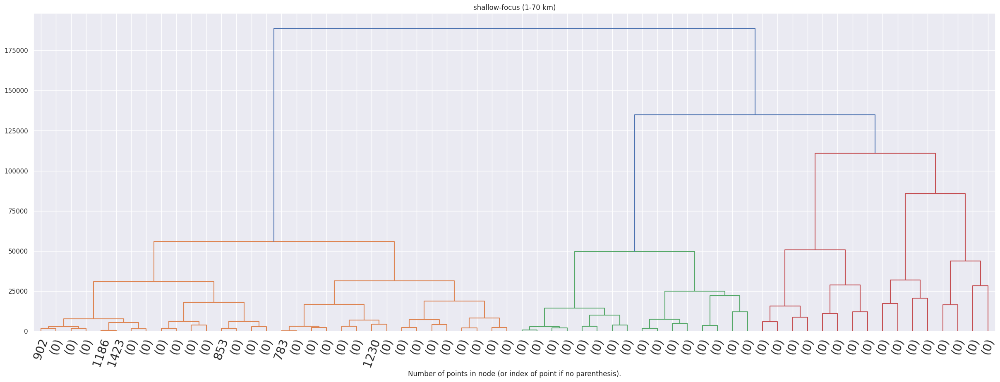

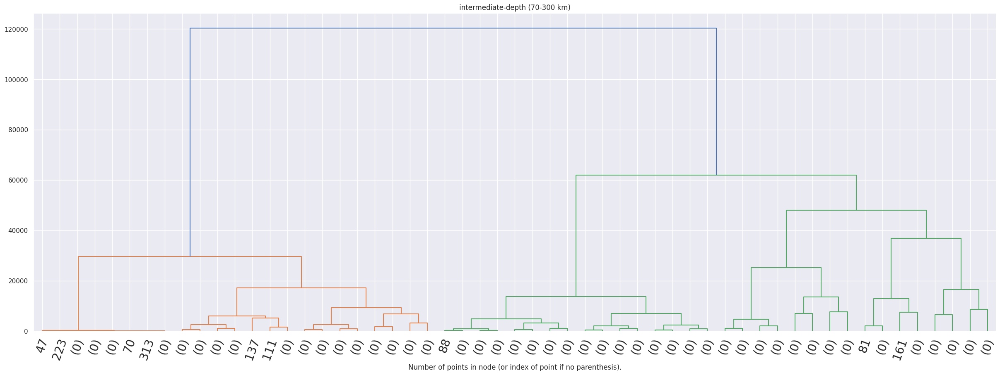

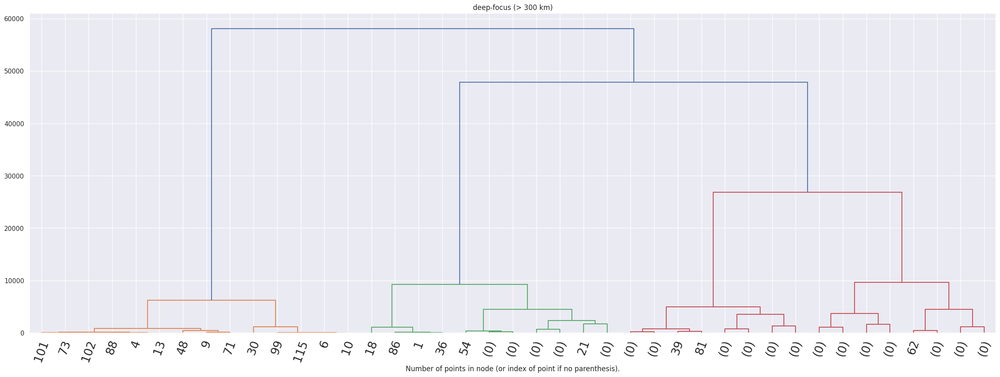

In [71]:
# setting distance_threshold=0 ensures we compute the full tree.

for i, dfs in enumerate(df_0123):
    model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
    model = model.fit(dfs.loc[:, features_xyz]) # ['Longitude_50', 'Latitude', 'Richter']])
    plot_dendrogram(model, title_depth[i], truncate_mode='level', p=5) # p=3,5,7

To my opinion clustering [6, 11, 5, 4] from previous paragraph - is quite good for the dedrograms when levels cut off.

.

# **6. Metrics**

### 6.0. KMeans-clusters renumering for Confusion matrix

Here again K-means, because I decided to use the same number of clusters as for agglomerative clustering.

In [72]:
#n_clu_0123 = [3, 3, 5, 4]
n_clu_0123 = [6, 11, 5, 4]
labels_pred_kmeans = []

for i, dfi in enumerate(df_0123):
    #kmeans = KMeans(n_clusters=n_clu_0123[i], random_state=22).fit(dfi.loc[:, ['Longitude_50', 'Latitude', 'Richter']])
    kmeans = KMeans(n_clusters=n_clu_0123[i],
                    n_init= 'auto',
                    random_state=22).fit(dfi.loc[:, ['xx', 'yy', 'zz']])
    dfi['Clusters'] = kmeans.labels_
    labels_pred_kmeans.append(kmeans.labels_)

#scatters_4x2_graphs(df_0123)

I chose to do the comparison of clusters by color manually for two reasons:
1. Different boundaries of clusters for K-means and agglomerative, which complicates automatic matching, for example, through the selection of the maximum number of elements.
2. A small number of clusters (no more than 11 in each class).

In [73]:
Clust = [{'Clusters':{0:4, 1:2, 2:1, 3:3, 4:5, 5:0}},
         {'Clusters':{0:5, 1:2, 2:4, 3:8, 4:3, 5:10, 6:0, 7:7, 8:6, 9:1, 10:9}},
         {'Clusters':{0:4, 1:2, 2:0, 3:3, 4:1}},
         {'Clusters':{0:0, 1:1, 2:2, 3:3, 4:4}}]
Clust

[{'Clusters': {0: 4, 1: 2, 2: 1, 3: 3, 4: 5, 5: 0}},
 {'Clusters': {0: 5,
   1: 2,
   2: 4,
   3: 8,
   4: 3,
   5: 10,
   6: 0,
   7: 7,
   8: 6,
   9: 1,
   10: 9}},
 {'Clusters': {0: 4, 1: 2, 2: 0, 3: 3, 4: 1}},
 {'Clusters': {0: 0, 1: 1, 2: 2, 3: 3, 4: 4}}]

In [74]:
for i in range(4):
    df_0123[i] = df_0123[i].replace(Clust[i])

In [75]:
labels_pred_kmeans2 = [np.array(df_0123[0]['Clusters']),
                       np.array(df_0123[1]['Clusters']),
                       np.array(df_0123[2]['Clusters']),
                       np.array(df_0123[3]['Clusters'])
                       ]

<Figure size 2200x1000 with 0 Axes>

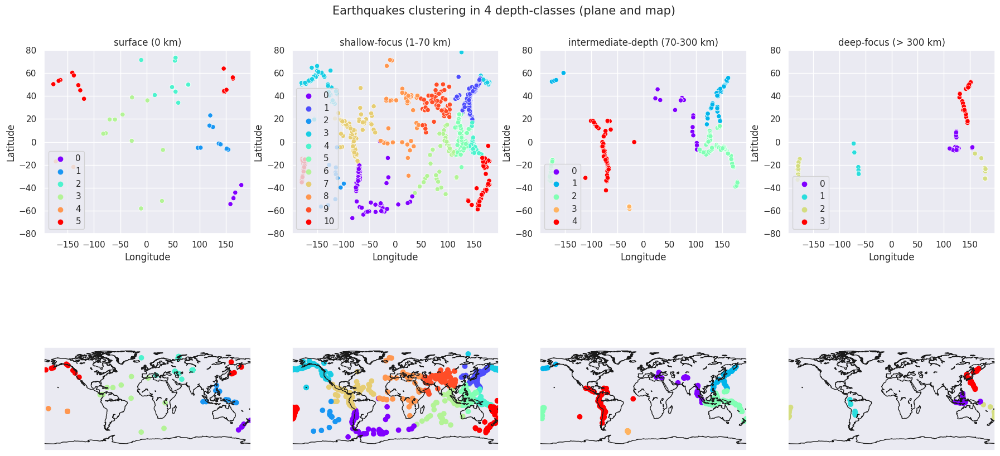

In [76]:
scatters_4x2_graphs(df_0123)

.

### 6.1. Confusion matrix (Agglomerative and KMeans)

#### 6.1.1. Conf.matrix non-sync clusters

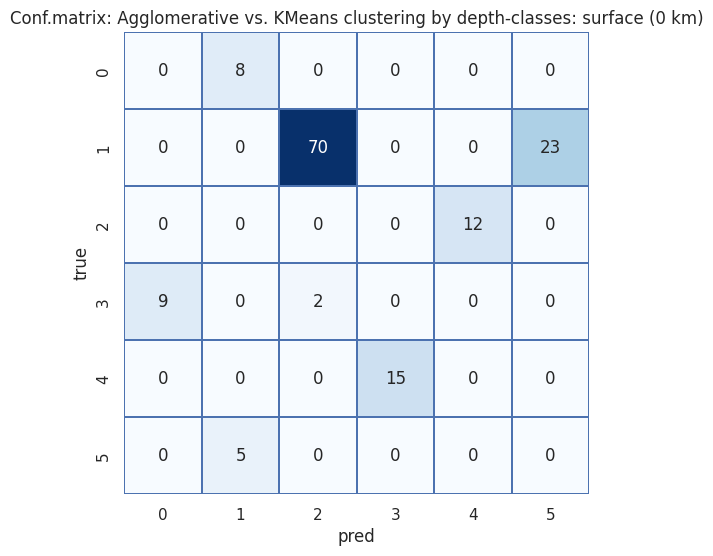

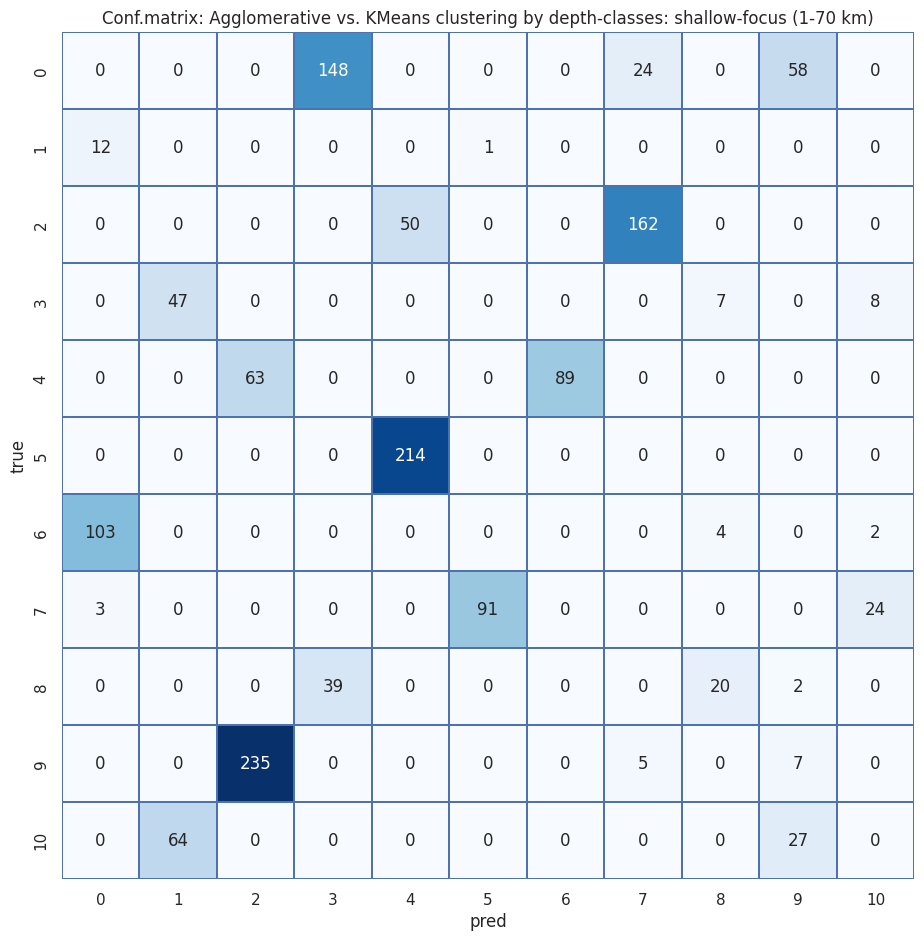

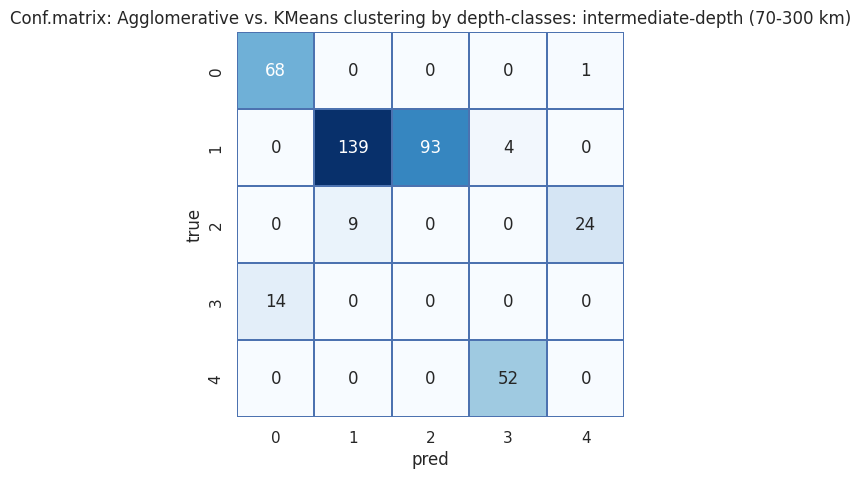

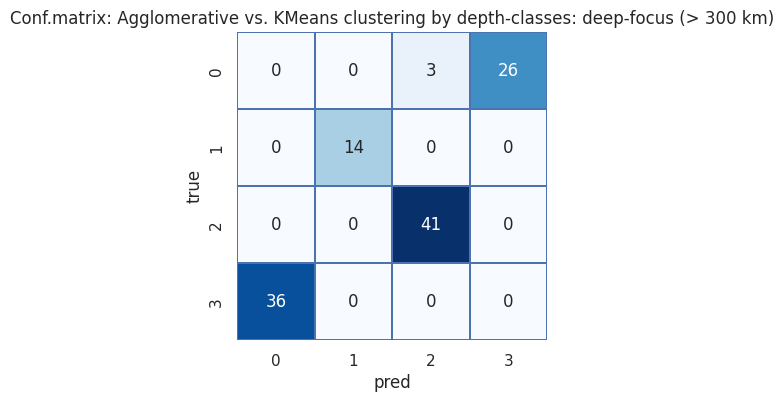

In [77]:
from sklearn.metrics import confusion_matrix

for i in range(4):
    length_cm = len(np.unique(labels_true_agglo[i]))
    plt.figure(figsize=(length_cm,length_cm))

    sns.heatmap(confusion_matrix(labels_pred_kmeans[i],
                                 labels_true_agglo[i]),
                cmap='Blues',
                annot=True,
                linewidths=0.1,
                linecolor='b',
                fmt='.0f',
                cbar=False)
    plt.title(f'Conf.matrix: Agglomerative vs. KMeans clustering by depth-classes: {title_depth[i]}')
    plt.xlabel('pred')
    plt.ylabel('true')
    plt.show()

.

#### 6.1.2. Conf.matrix sync clusters

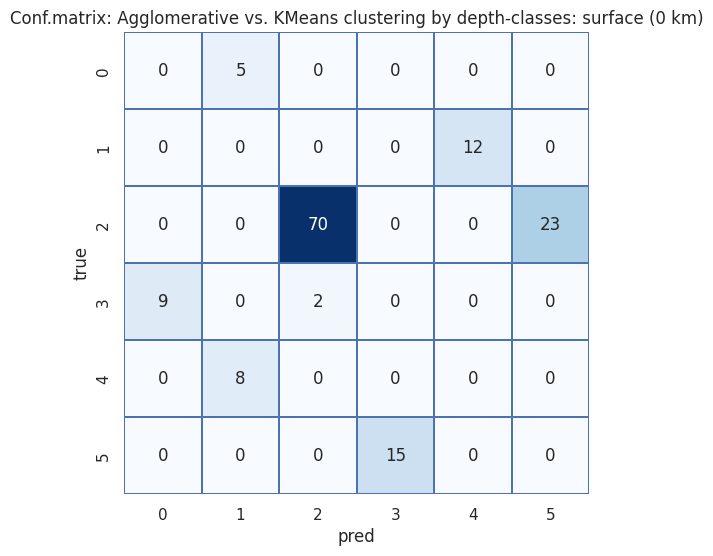

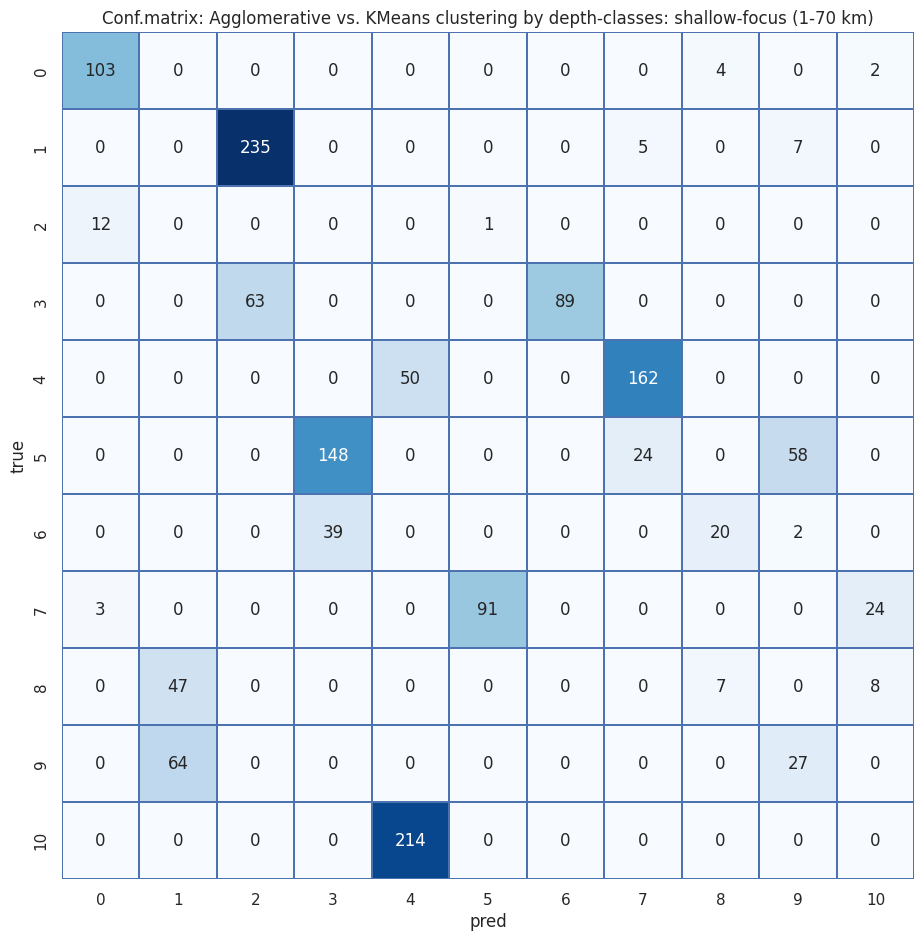

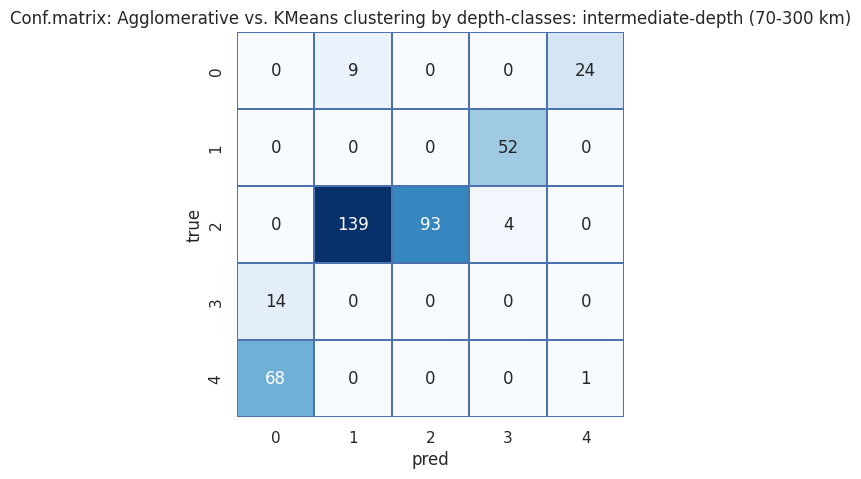

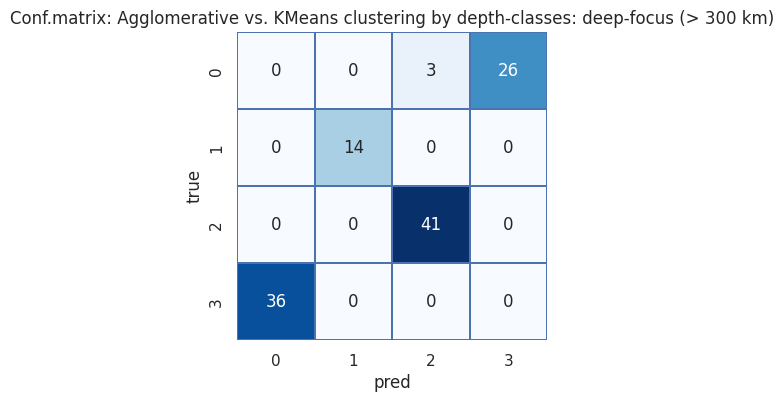

In [78]:
from sklearn.metrics import confusion_matrix

for i in range(4):
    length_cm = len(np.unique(labels_true_agglo[i]))
    plt.figure(figsize=(length_cm,length_cm))

    sns.heatmap(confusion_matrix(labels_pred_kmeans2[i],
                                 labels_true_agglo[i]),
                cmap='Blues',
                annot=True,
                linewidths=0.1,
                linecolor='b',
                fmt='.0f',
                cbar=False)
    plt.title(f'Conf.matrix: Agglomerative vs. KMeans clustering by depth-classes: {title_depth[i]}')
    plt.xlabel('pred')
    plt.ylabel('true')
    plt.show()

The most unbalanced class is the second, where some cluster boundaries differ the most between K-Means and Agglomerative.

.

### 6.2. Rand Index

The Rand Index computes a similarity measure between two clusterings by considering all pairs of samples and counting pairs that are assigned in the same or different clusters in the predicted and true clusterings

In [79]:
from sklearn import metrics

print('Rand index between Agglomerative and KMeans clusterins')
for i in range(4):
    print(round(metrics.rand_score(labels_pred_kmeans2[i],
                                   labels_true_agglo[i]), 3))

Rand index between Agglomerative and KMeans clusterins
0.824
0.929
0.796
0.972


In [80]:
print('Rand index between Agglomerative and DBSCAN clusterins')
for i in range(4):
    print(round(metrics.rand_score(labels_pred_dbscan[i],
                                   labels_true_agglo[i]), 3))



Rand index between Agglomerative and DBSCAN clusterins
0.41
0.148
0.269
0.435


.

### 6.3. Adjusted rand score

ARI = normalized RI. T he adjusted Rand index is thus ensured to have a value close to 0.0 for random labeling independently of the number of clusters and samples and exactly 1.0 when the clusterings are identical (up to a permutation).

In [81]:
print('Adjusted rand score between Agglomerative and KMeans clusterings')
for i in range(4):
    print(round(metrics.adjusted_mutual_info_score(labels_pred_kmeans2[i],
                                   labels_true_agglo[i]), 3))

Adjusted rand score between Agglomerative and KMeans clusterings
0.789
0.777
0.727
0.933


In [82]:
print('Adjusted rand score between Agglomerative and DBSCAN clusterings')
for i in range(4):
    print(round(metrics.adjusted_mutual_info_score(labels_pred_dbscan[i],
                                   labels_true_agglo[i]), 3))

Adjusted rand score between Agglomerative and DBSCAN clusterings
0.026
0.001
0.013
0.025


.

### 6.4. Homogeneity score

How much each cluster consists of objects of the same class.

Homogeneity metric of a cluster labeling given a ground truth.

A clustering result satisfies homogeneity if all of its clusters contain only data points which are members of a single class.

In [83]:
print('Homogeneity score between Agglomerative and KMeans clusterings')
for i in range(4):
    print(round(metrics.homogeneity_score(labels_pred_kmeans2[i],
                                   labels_true_agglo[i]), 3))

Homogeneity score between Agglomerative and KMeans clusterings
0.897
0.778
0.814
0.931


In [84]:
print('Homogeneity score score between Agglomerative and DBSCAN clusterings')
for i in range(4):
    print(round(metrics.homogeneity_score(labels_pred_dbscan[i],
                                   labels_true_agglo[i]), 3))

Homogeneity score score between Agglomerative and DBSCAN clusterings
0.142
0.056
0.182
0.068


.

### 6.5. Calinski harabasz score

Compute the Calinski and Harabasz score. It is also known as the Variance Ratio Criterion.

The score is defined as ratio of the sum of between-cluster dispersion and of within-cluster dispersion.

In [85]:
print('Calinski harabasz score between Agglomerative and KMeans clusterings')
for i in range(4):
    print(round(metrics.calinski_harabasz_score(labels_pred_kmeans2[i].reshape(-1, 1),
                                   np.ravel(labels_true_agglo[i].reshape(-1, 1))), 1))

Calinski harabasz score between Agglomerative and KMeans clusterings
76.3
698.7
628.9
498.0


In [86]:
print('Calinski harabasz score between Agglomerative and DBSCAN clusterings')
for i in range(4):
    print(round(metrics.calinski_harabasz_score(labels_pred_dbscan[i].reshape(-1, 1),
                                   np.ravel(labels_true_agglo[i].reshape(-1, 1))), 1))

Calinski harabasz score between Agglomerative and DBSCAN clusterings
2.4
1.1
2.9
2.8


.

# **7. Conclusions**





---

1. Data preprocessing:
  - All data are numerical.
  - Only 1 duplicated row -> deleted with reindexing.
  - No one NaN.

---

2. EDA
  - Earthquake depth starts from 0 km - it doesn't correspond to ordinary earthquakes.
  - Correct ranges for Latitude and Longitude.
  - Richter magnitudes has a range only between 5.8 and 6.8.
  - Depth in histagram has a skewness -> apply log10 scale.
log10 scale showed mixed Gauss distributions.
  - A division into three classes by depth is proposed in accordance with the theoretical foundations of earthquakes, which is close to the distributions on the log scale.
  - 0 km earthquakes have technogenic nature and some volcanic activity. It was allocated to a separate class.
  - Two options for adjusting the coordinates were proposed to avoid artificial separation of clusters: 1) shifting the boundary of surface coordinates from -180 to -50 degrees longitude; 2) Convert to 3D coordinates. The second option was chosen, as more complete without a coordinate boundary.
  - Richter in histagram shows exponential dependence with increasing magnitude and any more.
  - There is no high correlations between original features.

---

3. K-Means clustering algorithm for complete dataset clustering

  - The algorithm with 15 clusters (manual value) showed poor clustering when taking into account the coordinates and depth of earthquakes, and good clustering when taking into account only the coordinates.
  - An assumption was made about the minimum number of clusters (8 pieces) based on the map of tectonic plates.
  - Optimization with the Elbow rule showed a division into 3 ... 5 clusters - rather small values.
  - Silhouette score with value 0.578 shoed 9 clusters - it's much better.
  - Silhouette graphs for a specific dataset doesn't give an unambiguous answer in the choice, since it is difficult to choose the most homogeneous strips among significantly heterogeneous ones.
  - GaussianMixture method showed maximum scores at -0.473 (9 clusters).

---

4. Clustering models for 4 depth-classes. KMEANS

  - Created new list df_0123 with 4 dataframes for four depth-types df_0...df_3.
  - Elbow method gave 3 clusters for all 4 classes.
  - GridSearchCV doesn't work correctly - nrs of clusters are maximum from gived range.

---

5. Clustering models for 4 depth-classes. DBSCAN

  - NearestNeighbors gave optimal eps = [800, 250, 400, 300], but too much outliers on maps.
  - Manual changing these values didn't help to improve results significantly.
  - Better clustering for all dataset was predicted with nr of clusters 16 with manually found eps and min_samples. Sometimes it was found 34 clusters, but again too much outliers.
  - Haversine showed the worst result without reasonable clustering.
  - Some different maps were applied.

---

6. Clustering models for 4 depth-classes. AGGLOMERATIVE

  - Silhouette scores for different clusters showed a very small difference, so it's difficult to determine the numbers.   - Optimal nr of cluster: [6, 11, 4, 3], but manually corrected to [6, 11, 5, 4].
  - The clustering is much better and looks more logical than other model.
  - Let Agglomerative be true for calculation metrics, as the best clustering result.
  - Clustering [6, 11, 5, 4] is quite good for the dedrograms when levels cut off.

---

7. Metrics

  - KMeans-clusters were renumered manually for future correct Confusion matrix
  - Identical nr of clusters were choisen for Kmeans as in Agglomerative for sutable comparison with Confusion matrix.
  - Confusion matrix showed not bad result Agglomerative-KMeans on diagonal. But the most unbalanced class is the second, where some cluster boundaries differ.
  - Metrics RI, ARI, Homogeneity score have similar resuls as for pair Agglomerative-KMeans and Agglomerative-DBSCAN. DBSCAN with its not good result above shows values close to zero. Calinski is difficult to be applied with wide range results.
  - Rating of the best classes score for pair Agglomerative-KMeans (descending): 4, 1, 2, 3 (1 - 0 km, 2 - before 70 km, 3 - 70-300 km, 4 - more than 300 km).


.